# Introduction to TensorFlow in Python

In [1]:
data_folder = "C:/Users/Admin/Dropbox/Python/ficheiros/DataCamp/DataCamp - Introduction to TensorFlow in Python/"

In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
# CHAPTER 1 - Introduction to TensorFlow
import tensorflow as tf
from tensorflow import constant, Variable, add, ones, matmul, multiply, reduce_sum
from tensorflow import gradients, reshape, random
from tensorflow import GradientTape as tape

# CHAPTER 2 - Linear models
from tensorflow import keras

# CHAPTER 3 - Neural Networks
import math
from sklearn.model_selection import train_test_split

# CHAPTER 4 - High Level APIs
from tensorflow import feature_column, estimator


In [4]:
%%time
from pdf2image import convert_from_path

poppler_path = 'C:/Users/Admin/poppler-0.68.0/bin'

# pdf with the course material
pdf_1 = convert_from_path(data_folder +"chapter1.pdf", 50, poppler_path=poppler_path)
pdf_2 = convert_from_path(data_folder +"chapter2.pdf", 50, poppler_path=poppler_path)
pdf_3 = convert_from_path(data_folder +"chapter3.pdf", 50, poppler_path=poppler_path)
pdf_4 = convert_from_path(data_folder +"chapter4.pdf", 50, poppler_path=poppler_path)

Wall time: 6.56 s


In [5]:
# plot 1 image
def plot_pdf_1(pdf, page, left=0, bottom=0, right=1, top=1, wspace=0, hspace=0):
    plt.axis('off'); plt.imshow(pdf[page])
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 2 images horizontally
def plot_pdf_2(pdf, page1, page2, left=0, bottom=0, right=2.2, top=1, wspace=0, hspace=0.05, format_img=".jpg"):
    plt.subplot(1, 2, 1); plt.axis('off'); plt.imshow(pdf[page1])
    plt.subplot(1, 2, 2); plt.axis('off'); plt.imshow(pdf[page2])
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 3 images horizontally
def plot_pdf_3(pdf, page1, page2, page3, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 3, 1); plt.axis('off'); plt.imshow(pdf[page1]); 
    plt.subplot(1, 3, 2); plt.axis('off'); plt.imshow(pdf[page2])
    plt.subplot(1, 3, 3); plt.axis('off'); plt.imshow(pdf[page3])
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()
    
# plot 4 images horizontally
def plot_pdf_4(pdf, page1,page2,page3,page4, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 4, 1); plt.axis('off'); plt.imshow(pdf[page1])
    plt.subplot(1, 4, 2); plt.axis('off'); plt.imshow(pdf[page2])
    plt.subplot(1, 4, 3); plt.axis('off'); plt.imshow(pdf[page3])
    plt.subplot(1, 4, 4); plt.axis('off'); plt.imshow(pdf[page4])    
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

In [6]:
# plot 1 image
def plot_1(image1, left=0, bottom=0, right=1, top=1, wspace=0, hspace=0, format_img=".jpg"):
    image = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(image)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 2 images horizontally
def plot_2(image1, image2, left=0, bottom=0, right=2.2, top=1, wspace=0, hspace=0.05, format_img=".jpg"):
    plt.subplot(1, 2, 1); image = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(image)
    plt.subplot(1, 2, 2); image = plt.imread(data_folder + (image2+format_img)); plt.axis('off'); plt.imshow(image)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

# plot 3 images horizontally
def plot_3(image1, image2, image3, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 3, 1); imagem = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(imagem); 
    plt.subplot(1, 3, 2); imagem = plt.imread(data_folder + (image2+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 3, 3); imagem = plt.imread(data_folder + (image3+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()
    
# plot 4 images horizontally
def plot_4(image1, image2, image3, image4, left=0, bottom=-1, right=2.7, top=1, wspace=0, hspace=0.1, format_img=".jpg"):
    plt.subplot(1, 4, 1); imagem = plt.imread(data_folder + (image1+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 4, 2); imagem = plt.imread(data_folder + (image2+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 4, 3); imagem = plt.imread(data_folder + (image3+format_img)); plt.axis('off'); plt.imshow(imagem)
    plt.subplot(1, 4, 4); imagem = plt.imread(data_folder + (image4+format_img)); plt.axis('off'); plt.imshow(imagem)    
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    plt.show()

##    CHAPTER 1  - Introduction to TensorFlow

Before you can build advanced models in TensorFlow 2.0, you will first need to understand the basics. In this chapter, you’ll learn how to define constants and variables, perform tensor addition and multiplication, and compute derivatives. Knowledge of linear algebra will be helpful, but not necessary.

#### Exercício 1 - Constants and variables

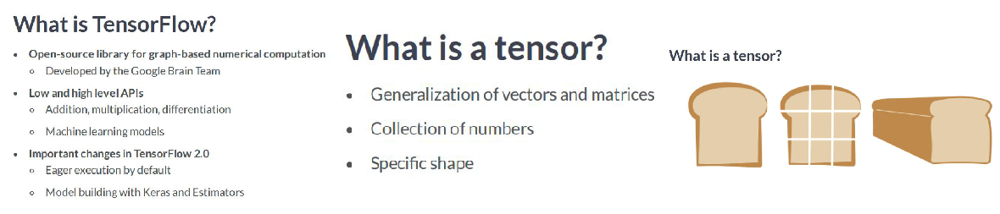

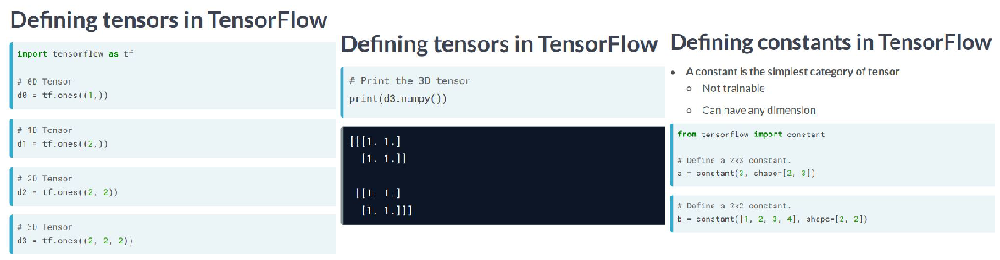

tf.Tensor([1.], shape=(1,), dtype=float32)
tf.Tensor(
[[3 3 3]
 [3 3 3]], shape=(2, 3), dtype=int32)


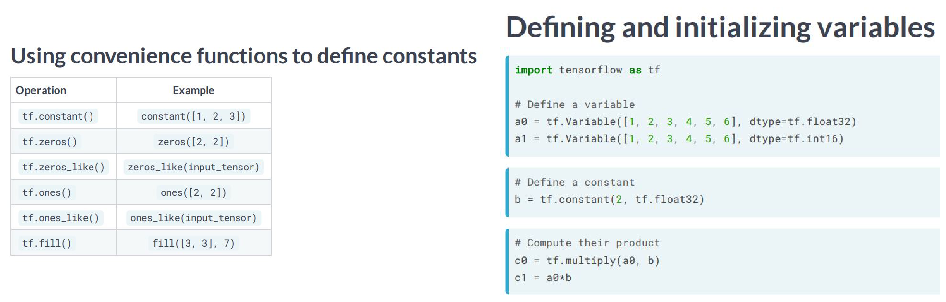

In [7]:
#vídeo

plot_3('tflow', 'tensor', 'tensor2'); print("="*120)

import tensorflow as tf
from tensorflow import constant

plot_3('tensor3', 't4', 'constants')

print(tf.ones((1, )))
print(constant(3, shape=[2, 3])); print("="*120)

plot_2('convenience_functions', 'variables')

Exercício 2

In [8]:
# Defining data as constants

credit = pd.read_csv(data_folder + "uci_credit_card.csv")
credit_numpy = np.array(credit[['EDUCATION', 'MARRIAGE', 'AGE', 'BILL_AMT1']].copy())
display(credit_numpy)
print("="*120)

#########################

# Import constant from TensorFlow
from tensorflow import constant

# Convert the credit_numpy array into a tensorflow constant
credit_constant = constant(credit_numpy)

# Print constant datatype
print('The datatype is:', credit_constant.dtype)

# Print constant shape
print('The shape is:', credit_constant.shape)
credit_constant

array([[ 2.0000e+00,  1.0000e+00,  2.4000e+01,  3.9130e+03],
       [ 2.0000e+00,  2.0000e+00,  2.6000e+01,  2.6820e+03],
       [ 2.0000e+00,  2.0000e+00,  3.4000e+01,  2.9239e+04],
       ...,
       [ 2.0000e+00,  2.0000e+00,  3.7000e+01,  3.5650e+03],
       [ 3.0000e+00,  1.0000e+00,  4.1000e+01, -1.6450e+03],
       [ 2.0000e+00,  1.0000e+00,  4.6000e+01,  4.7929e+04]])

The datatype is: <dtype: 'float64'>
The shape is: (30000, 4)


<tf.Tensor: shape=(30000, 4), dtype=float64, numpy=
array([[ 2.0000e+00,  1.0000e+00,  2.4000e+01,  3.9130e+03],
       [ 2.0000e+00,  2.0000e+00,  2.6000e+01,  2.6820e+03],
       [ 2.0000e+00,  2.0000e+00,  3.4000e+01,  2.9239e+04],
       ...,
       [ 2.0000e+00,  2.0000e+00,  3.7000e+01,  3.5650e+03],
       [ 3.0000e+00,  1.0000e+00,  4.1000e+01, -1.6450e+03],
       [ 2.0000e+00,  1.0000e+00,  4.6000e+01,  4.7929e+04]])>

Exercício 3

In [9]:
%%time
# Defining variables

from tensorflow import Variable

# Define the 1-dimensional variable A1
A1 = Variable([1, 2, 3, 4])

# Print the variable A1
print(A1)

# Convert A1 to a numpy array and assign it to B1
B1 = A1.numpy()

# Print B1
print(B1)


<tf.Variable 'Variable:0' shape=(4,) dtype=int32, numpy=array([1, 2, 3, 4])>
[1 2 3 4]
Wall time: 5 ms


#### Exercício 4 - Basic operations

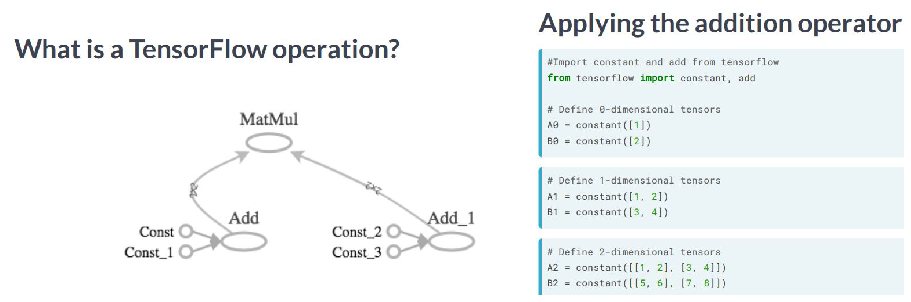

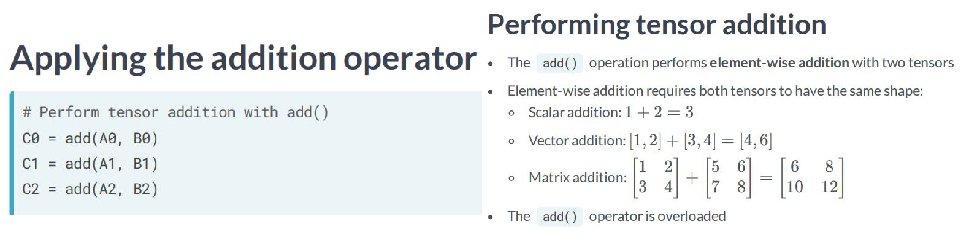

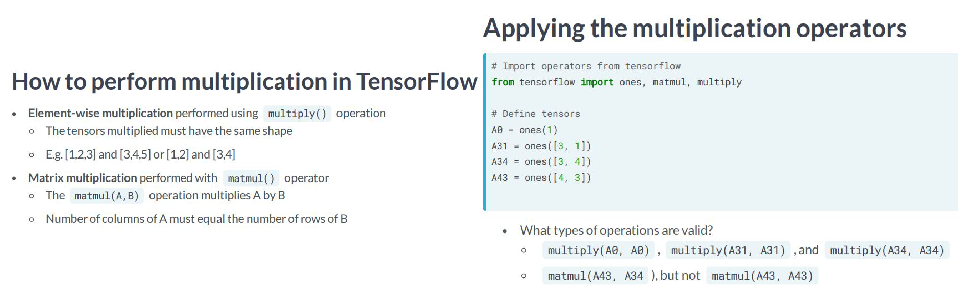

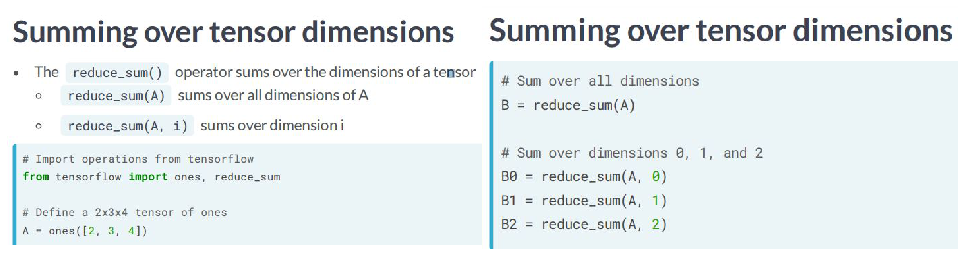

In [10]:
#vídeo
from tensorflow import constant, add, ones, matmul, multiply, reduce_sum

plot_2('op', 'addition'); plot_2('addition-op', 'tensor_add'); print("="*120)
plot_2('mult1', 'mult2'); print("="*120); plot_2('sum1', 'sum2')

Exercício 5

In [11]:
# Performing element-wise multiplication

from tensorflow import constant, ones_like, multiply

# Define tensors A1 and A23 as constants
A1 = constant([1, 2, 3, 4])
A23 = constant([[1, 2, 3], [1, 6, 4]])

# Define B1 and B23 to have the correct shape
B1 = ones_like(A1)
B23 = ones_like(A23)

# Perform element-wise multiplication
C1 = multiply(A1, B1)
C23 = multiply(A23, B23)

# Print the tensors C1 and C23
print('C1: {}'.format(C1.numpy()))
print('C23: \n{}'.format(C23.numpy()))

C1: [1 2 3 4]
C23: 
[[1 2 3]
 [1 6 4]]


Exercício 6

In [12]:
# Making predictions with matrix multiplication

from tensorflow import constant, matmul

# Define features, params, and bill as constants
features = constant([[2, 24], [2, 26], [2, 57], [1, 37]])
params = constant([[1000], [150]])
bill = constant([[3913], [2682], [8617], [64400]])

# Compute billpred using features and params
billpred = matmul(features, params)

# Compute and print the error
error = bill - billpred
print(error.numpy())

# Understanding matrix multiplication will make things simpler when we start making predictions with linear models.

[[-1687]
 [-3218]
 [-1933]
 [57850]]


Exercício 7

In [13]:
# Summing over tensor dimensions

# This contains the value of bond and stock wealth, respectively, for five individuals, in thousands of dollars.
wealth = constant([[11, 50], [7, 2], [4, 60], [3, 0], [25, 10]])


# --> Use wealth, reduce_sum(), and .numpy() to determine which statements are correct about wealth.

# 1) The individual in the first row has the highest total wealth (i.e. stocks + bonds). (FALSE)
print("""{}. The individual in the {} row has the highest total wealth.\n""".format(reduce_sum(wealth, 1).numpy(),
                                                                            np.argmax(reduce_sum(wealth, 1).numpy()) + 1))


# 2) Combined, the 5 individuals hold $50,000 in stocks. (FALSE)
print("""Combined, the 5 individuals hold ${} in stocks.""".format(reduce_sum(wealth, 0).numpy()[1]))

# 3) Combined, the 5 individuals hold $50,000 in bonds. (TRUE)
print("""Combined, the 5 individuals hold ${} in bonds.""".format(reduce_sum(wealth, 0).numpy()[0]))

# 4) The individual in the second row has the lowest total wealth (i.e. stocks + bonds). (FALSE)
print("""\n{}. The individual in the {} row has the lowest total wealth.""".format(reduce_sum(wealth, 1).numpy(),
                                                                            np.argmin(reduce_sum(wealth, 1).numpy()) + 1))

[61  9 64  3 35]. The individual in the 3 row has the highest total wealth.

Combined, the 5 individuals hold $122 in stocks.
Combined, the 5 individuals hold $50 in bonds.

[61  9 64  3 35]. The individual in the 4 row has the lowest total wealth.


#### Exercício 8 - Advanced operations

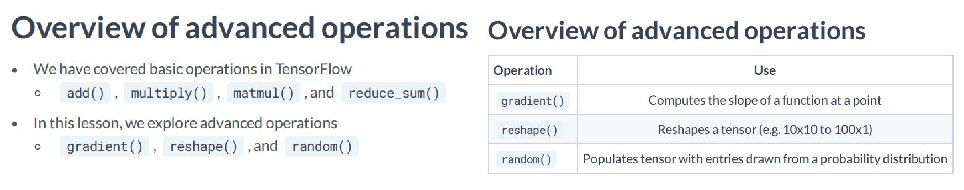

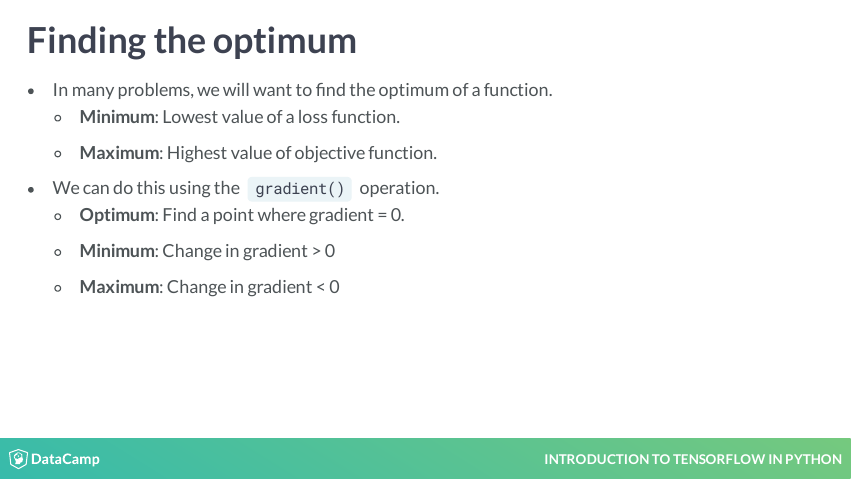

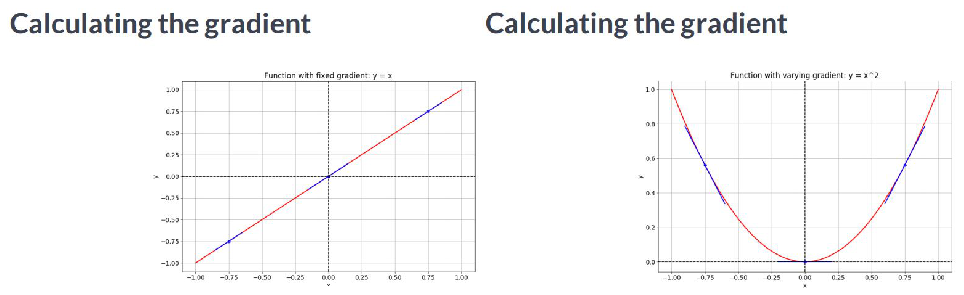

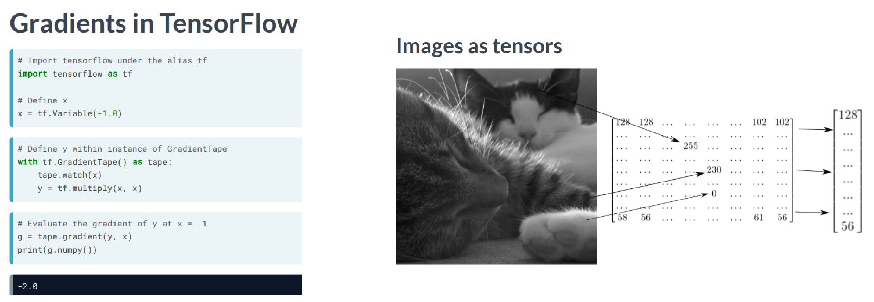

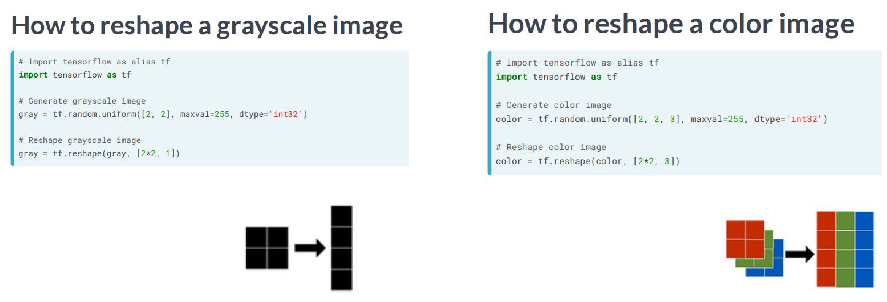

In [14]:
#vídeo
from tensorflow import gradients, reshape, random
from tensorflow import GradientTape as tape

plot_2('advanced', 'advanced2'); print("="*120); display(pdf_1[26]); print("="*120)
plot_2('gradient1', 'gradient2'); print("="*120)
plot_2('gradients_tf', 'images'); plot_2('reshape', 'reshape2')

Exercício 9

In [15]:
# Reshaping tensors

gray_tensor = np.array([[187, 189, 190, 192, 195, 198, 198, 198, 200, 200, 201, 205, 206,
        203, 206, 206, 206, 207, 209, 207, 205, 205, 208, 208, 206, 207,
        206, 206],
       [189, 191, 193, 195, 197, 199, 200, 199, 200, 201, 202, 206, 206,
        208, 204, 204, 210, 209, 208, 208, 207, 206, 208, 208, 207, 207,
        207, 207],
       [189, 192, 195, 198, 198, 201, 202, 203, 205, 206, 205, 209, 207,
        204, 211, 210, 205, 208, 211, 208, 206, 207, 209, 210, 210, 208,
        210, 210],
       [191, 192, 195, 197, 199, 199, 204, 201, 203, 208, 206, 207, 209,
        207, 213, 208, 209, 211, 221, 205, 204, 239, 182, 212, 213, 212,
        209, 209],
       [193, 195, 195, 199, 201, 201, 203, 205, 206, 216, 223, 203, 207,
        239, 225, 193, 188, 230, 232, 195, 176, 239, 191, 205, 215, 212,
        211, 213],
       [194, 196, 199, 200, 206, 202, 205, 207, 196, 255, 238, 197, 160,
        235, 226, 191, 146, 190, 226, 201, 160, 228, 211, 162, 215, 214,
        216, 213],
       [195, 198, 201, 202, 202, 203, 232, 215, 197, 246, 230, 215, 153,
        235, 221, 205, 162, 181, 224, 210, 166, 202, 209, 163, 190, 213,
        211, 213],
       [196, 198, 201, 208, 202, 243, 240, 215, 166, 246, 233, 223, 171,
        235, 212, 214, 165, 206, 224, 199, 152, 126, 206, 199, 170, 165,
        214, 215],
       [198, 201, 197, 204, 189, 247, 244, 230, 206, 246, 235, 220, 188,
        235, 211, 218, 142, 227, 223, 176, 152,  74, 192, 206, 200, 145,
        177, 215],
       [200, 203, 206, 206, 236, 254, 254, 233, 215, 205, 242, 219, 185,
        234, 230, 223, 131, 201, 209, 156, 141,  83, 175, 220, 196, 157,
        185, 222],
       [201, 200, 201, 193, 253, 231, 245, 246, 209, 159, 241, 214, 176,
        219, 234, 212, 133, 132, 175, 149, 109, 100, 225, 226, 209, 147,
        219, 221],
       [202, 203, 203, 196, 253, 209, 241, 233, 194, 150, 234, 204, 174,
        160, 208, 189, 146, 101, 172, 145,  76, 195, 230, 226, 194, 121,
        227, 224],
       [204, 203, 210, 245, 251, 222, 207, 198, 152, 112, 207, 171, 163,
         97, 163, 154, 122, 105, 175, 169, 175, 227, 226, 206, 154, 147,
        219, 225],
       [204, 205, 201, 250, 246, 217, 167, 204, 146, 116, 192, 170, 161,
         78, 151, 165, 115, 181, 228, 225, 223, 215, 203, 181, 144, 202,
        220, 227],
       [205, 207, 198, 252, 254, 228, 198, 185, 162, 128, 202, 194, 144,
         64, 135, 155, 237, 241, 237, 226, 211, 177, 179, 155, 142, 227,
        227, 228],
       [210, 211, 208, 255, 252, 240, 219, 187, 168, 148, 187, 202, 151,
        103, 192, 246, 253, 244, 233, 221, 199, 179, 157, 154, 116, 234,
        228, 231],
       [208, 211, 209, 254, 254, 248, 231, 216, 193, 175, 178, 201, 208,
        240, 253, 254, 249, 238, 222, 206, 185, 160, 143, 143, 214, 231,
        230, 230],
       [209, 212, 205, 254, 254, 252, 241, 229, 217, 187, 207, 224, 249,
        253, 251, 250, 242, 228, 206, 183, 166, 150, 143, 172, 229, 234,
        235, 230],
       [208, 211, 206, 254, 254, 255, 249, 238, 231, 211, 213, 230, 250,
        254, 252, 246, 233, 217, 188, 164, 150, 143, 120, 235, 231, 230,
        231, 231],
       [209, 213, 211, 253, 255, 255, 252, 244, 233, 222, 217, 224, 246,
        251, 242, 234, 225, 195, 173, 153, 134, 116, 225, 232, 235, 232,
        233, 233],
       [209, 214, 214, 246, 254, 253, 252, 240, 224, 214, 213, 217, 233,
        233, 230, 214, 199, 190, 150, 145, 127, 201, 233, 234, 232, 234,
        233, 234],
       [211, 215, 215, 243, 254, 254, 245, 232, 221, 208, 213, 218, 225,
        223, 206, 195, 169, 157, 132, 126, 170, 238, 234, 235, 234, 234,
        234, 234],
       [214, 216, 217, 209, 254, 250, 236, 229, 212, 197, 206, 210, 221,
        210, 196, 170, 148, 140, 118, 134, 240, 235, 234, 235, 235, 236,
        235, 236],
       [186, 175, 180, 150, 156, 158, 144, 124, 132, 134, 148, 153, 150,
        146, 137, 134, 126, 109, 114, 235, 237, 234, 238, 236, 236, 236,
        236, 237],
       [145, 135, 137, 134, 122, 136, 112,  95,  94,  90,  93,  65,  60,
         66,  61,  66,  58,  66,  80, 164, 247, 235, 236, 237, 239, 237,
        237, 235],
       [140, 146, 136, 132, 129, 134, 100, 103, 100, 100,  87,  64,  66,
         65,  57,  57,  61,  61,  64,  65, 177, 242, 238, 238, 239, 238,
        238, 238],
       [141, 146, 140, 131, 130, 136,  93,  97, 102,  96,  78,  71,  68,
         64,  60,  61,  60,  55,  58,  48, 254, 238, 240, 239, 238, 237,
        237, 238],
       [146, 143, 137, 138, 129, 113,  94,  98, 101,  87,  75,  70,  68,
         63,  60,  58,  56,  57,  63,  81, 237, 237, 240, 240, 239, 240,
        240, 240]])


color_tensor = np.array([[[190., 185., 191.],
        [190., 187., 196.],
        [191., 188., 195.],
        
        [208., 205., 212.],
        [206., 205., 210.],
        [206., 205., 210.]],
       [[192., 187., 193.],
        [192., 189., 198.],
        [194., 191., 198.],
        
        [207., 206., 212.],
        [207., 206., 211.],
        [207., 206., 211.]],

       [[190., 188., 193.],
        [193., 190., 199.],
        [196., 194., 199.],
        
        [207., 208., 213.],
        [207., 211., 214.],
        [210., 209., 214.]],

       [[144., 140., 128.],
        [147., 145., 130.],
        [139., 136., 121.],
        
        [238., 237., 243.],
        [238., 237., 245.],
        [238., 237., 243.]],

       [[144., 142., 130.],
        [148., 145., 130.],
        [145., 141., 132.],
        
        [237., 236., 244.],
        [237., 235., 246.],
        [238., 237., 245.]],

       [[149., 146., 137.],
        [146., 142., 130.],
        [141., 137., 126.],
        
        [240., 239., 247.],
        [240., 239., 247.],
        [240., 239., 247.]]])

display(gray_tensor.shape)  # (28, 28)
display(color_tensor.shape) # era suposto ter (28, 28, 3)

(28, 28)

(6, 6, 3)

In [16]:
# Reshape the grayscale image tensor into a vector
gray_vector = reshape(gray_tensor, (28*28, 1))
display(gray_vector.shape)

# Reshape the color image tensor into a vector
color_vector = reshape(color_tensor, (6*6*3, 1))
display(color_vector.shape)

TensorShape([784, 1])

TensorShape([108, 1])

Exercício 10

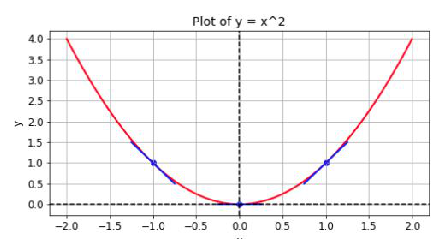

In [17]:
# Optimizing with gradients

# You are given a loss function, y=x**2, which you want to minimize. You can do this by computing the slope using the 
# GradientTape() operation at different values of x. If the slope is positive, you can decrease the loss by lowering x.
# If it is negative, you can decrease it by increasing x. This is how gradient descent works.

plot_1('x_2')

# In practice, you will use a high level tensorflow operation to perform gradient descent automatically. In this exercise, 
# however, you will compute the slope at x values of -1, 1, and 0. 

from tensorflow import GradientTape, multiply, Variable


In [18]:
def compute_gradient(x0):
    # Define x as a variable with an initial value of x0
    x = Variable(x0)
    with GradientTape() as tape:
        tape.watch(x)
        # Define y using the multiply operation
        y = multiply(x, x)
    # Return the gradient of y with respect to x
    return tape.gradient(y, x).numpy()

# Compute and print gradients at x = -1, 1, and 0
print(compute_gradient(-1.0))
print(compute_gradient(1.0))
print(compute_gradient(0.0))

print("""\nNotice that the slope is positive at x = 1, which means that we can lower the loss by reducing x. The slope is 
negative at x = -1, which means that we can lower the loss by increasing x. The slope at x = 0 is 0, which means that we 
cannot lower the loss by either increasing or decreasing x. This is because the loss is minimized at x = 0.""")

-2.0
2.0
0.0

Notice that the slope is positive at x = 1, which means that we can lower the loss by reducing x. The slope is 
negative at x = -1, which means that we can lower the loss by increasing x. The slope at x = 0 is 0, which means that we 
cannot lower the loss by either increasing or decreasing x. This is because the loss is minimized at x = 0.


Exercício 11

In [19]:
# Working with image data

letter = np.array([[1., 0., 1.], [1., 1., 0.], [1., 0., 1.]])  #  3x3 tensor
model = np.array([[ 1.,  0., -1.]]) #  1x3 tensor

from tensorflow import reshape, matmul, reduce_sum

#######

# Reshape model from a 1x3 to a 3x1 tensor
model = reshape(model, (3, 1))

# Multiply letter by model
output = matmul(letter, model)

# Sum over output and print prediction using the numpy method
prediction = reduce_sum(output)
print(prediction.numpy())


1.0


# CHAPTER 2 - Linear models


In this chapter, you will learn how to build, solve, and make predictions with models in TensorFlow 2.0. You will focus on a simple class of models – the linear regression model – and will try to predict housing prices. By the end of the chapter, you will know how to load and manipulate data, construct loss functions, perform minimization, make predictions, and reduce resource use with batch training.

#### Exercício 1 - Input data

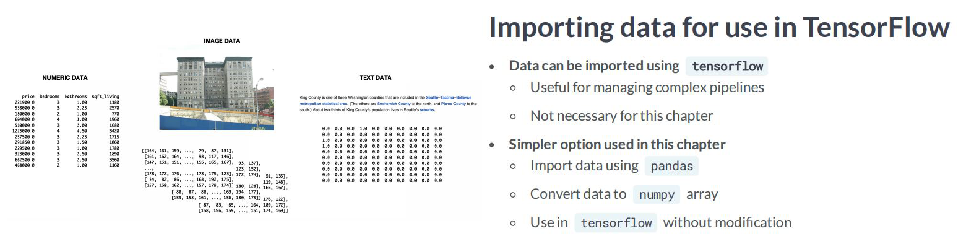

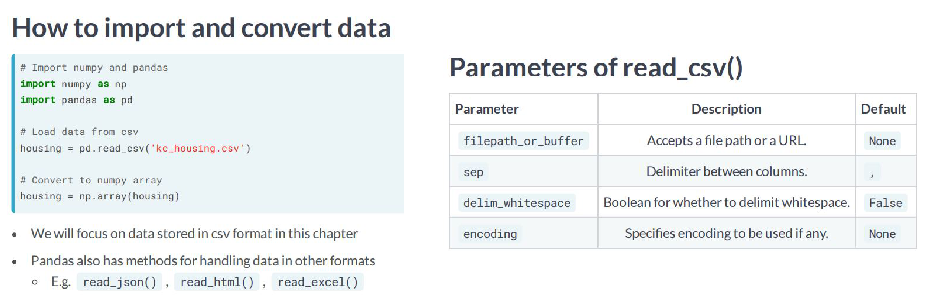

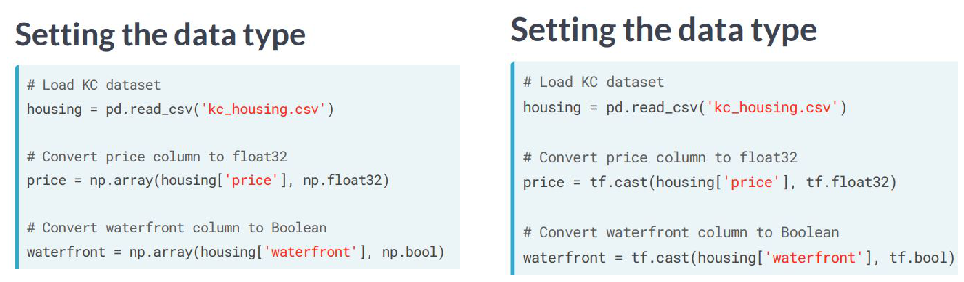

In [20]:
#vídeo
plot_2('input_data', 'import'); print("="*120); plot_2('1', '2'); plot_2('3', '4', wspace=0.1)

Exercício 2

In [21]:
# Load data using pandas

# Import pandas under the alias pd
import pandas as pd

# Assign the path to a string variable named data_path
data_path = 'kc_house_data.csv'

# Load the dataset as a dataframe named housing
housing = pd.read_csv(data_folder + data_path)

# Print the head
display(housing.head())

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


Exercício 3

In [22]:
# Setting the data type

# Use a numpy array to define price as a 32-bit float
price = np.array(housing['price'], np.float32)

# Define waterfront as a Boolean using cast
waterfront = tf.cast(housing['waterfront'], tf.bool)

# Print price and waterfront
print(price)
print(waterfront)

[221900. 538000. 180000. ... 402101. 400000. 325000.]
tf.Tensor([False False False ... False False False], shape=(21613,), dtype=bool)


#### Exercício 4 - Loss functions

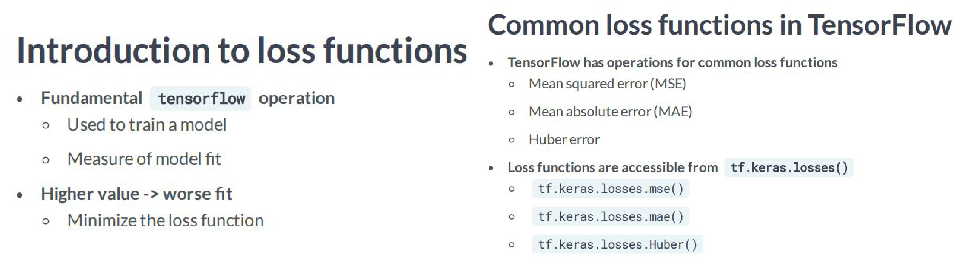

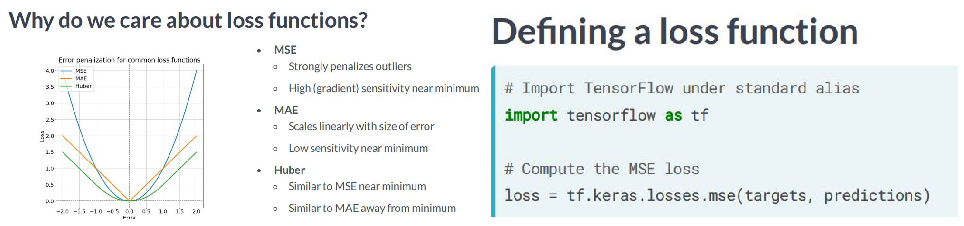

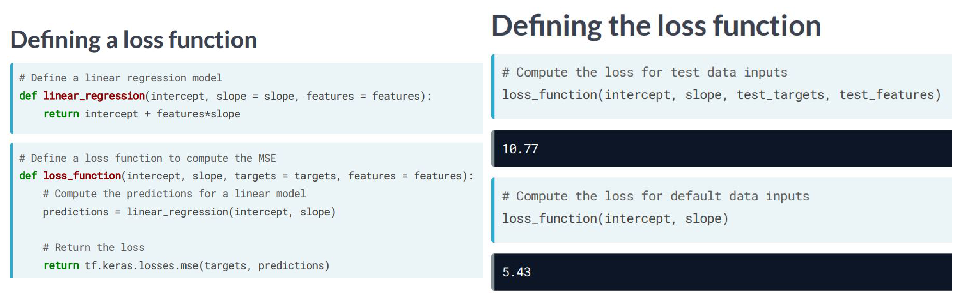

In [23]:
#vídeo
plot_2('loss1', 'loss2'); plot_2('loss3', 'loss4'); plot_2('loss5', 'loss6')

Exercício 5

In [24]:
# meu
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

X = housing.drop(['price', 'date'], axis=1).copy()
y = housing['price'].copy()

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

predictions = LinearRegression().fit(X, y).predict(X)
len(predictions) == len(price)

True

In [25]:
# Loss functions in TensorFlow

# Import the keras module from tensorflow
from tensorflow import keras

# Compute the mean squared error (mse)
loss = keras.losses.mse(price, predictions)

# Print the mean squared error (mse)
print("mean squared error (mse):", loss.numpy())

# Compute the mean absolute error (mae)
loss = keras.losses.mae(price, predictions)

# Print the mean absolute error (mae)
print("mean absolute error (mae):", loss.numpy())

mean squared error (mse): 40453550945.55067
mean absolute error (mae): 125921.54419397634


Exercício 6

In [26]:
# Modifying the loss function

targets = Variable([2.,  4.,  6.,  8., 10.])
features = Variable([1., 2., 3., 4., 5.])

# Initialize a variable named scalar
scalar = Variable(1.0, np.float32)

# Define the model
def model(scalar, features = features):
    return scalar * features

# Define a loss function
def loss_function(scalar, features = features, targets = targets):
    # Compute the predicted values
    predictions = model(scalar, features)
    
    # Return the mean absolute error loss
    return keras.losses.mae(targets, predictions)

# Evaluate the loss function and print the loss
print(loss_function(scalar).numpy())


# As you will see in the following lessons, this exercise was the equivalent of evaluating the loss function for a linear
# regression where the intercept is 0.

3.0


#### Exercício 7 - Linear regression

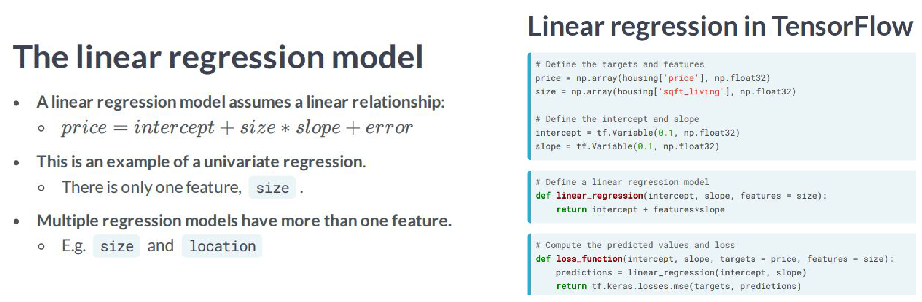

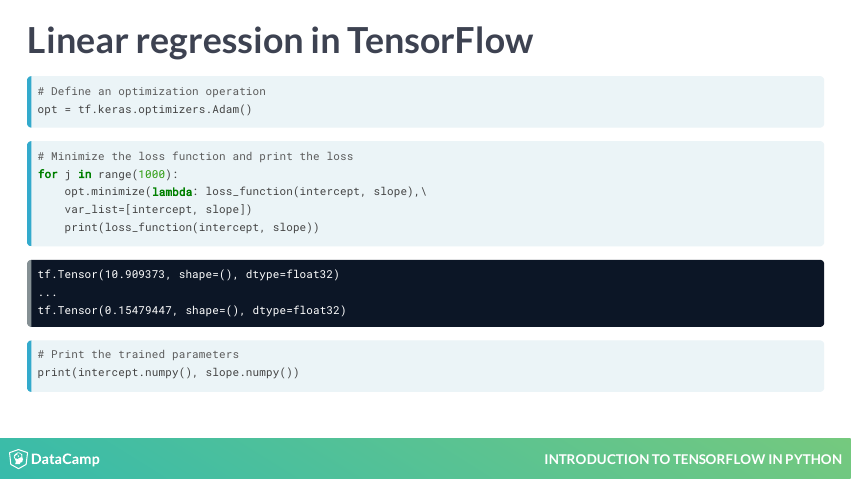

In [27]:
#vídeo
plot_2('linreg', 'linreg_tf'); display(pdf_2[22])

Exercício 8

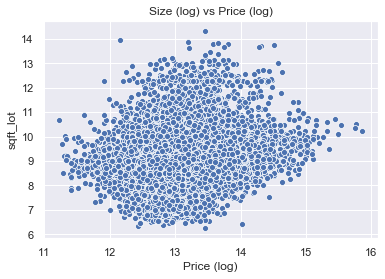

In [28]:
# Set up a linear regression

price_log = np.log(price)
size_log = np.log(housing.sqft_lot)

# plot just to see
sns.scatterplot(price_log, size_log)
plt.title('Size (log) vs Price (log)')
plt.xlabel('Price (log)')
plt.show()

#################

In [29]:
# Define a linear regression model
def linear_regression(intercept, slope, features = size_log):
    return intercept + slope*features

# Set loss_function() to take the variables as arguments
def loss_function(intercept, slope, features = size_log, targets = price_log):
    # Set the predicted values
    predictions = linear_regression(intercept, slope, features)
    
    # Return the mean squared error loss
    return keras.losses.mse(targets, predictions)

# Compute the loss for different slope and intercept values
print(loss_function(0.1, 0.1).numpy())
print(loss_function(0.1, 0.5).numpy())

145.44653009441748
71.86599380404861


Exercício 9

9.681214
11.737096
1.1297752
1.6701081
0.8090409
0.8125918
0.6220208
0.61184376
0.5933767
0.5702833


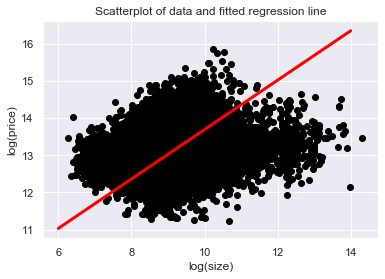

Notice that we printed loss_function(intercept, slope) every 10th execution for 100 executions. Each time, the 
loss got closer to the minimum as the optimizer moved the slope and intercept parameters closer to their optimal values.


In [30]:
# Train a linear model

# Initialize an adam optimizer
opt = keras.optimizers.Adam(0.5)

intercept = Variable(5.0, np.float32)
slope = Variable(0.001, np.float32)

def plot_results(intercept, slope):
    size_range = np.linspace(6,14,100)
    price_pred = [intercept+slope*s for s in size_range]
    plt.scatter(size_log, price_log, color = 'black')
    plt.plot(size_range, price_pred, linewidth=3.0, color='red')
    plt.xlabel('log(size)')
    plt.ylabel('log(price)')
    plt.title('Scatterplot of data and fitted regression line')
    plt.show()

for j in range(100):
    # Apply minimize, pass the loss function, and supply the variables
    opt.minimize(lambda: loss_function(intercept, slope), var_list=[intercept, slope])

    # Print every 10th value of the loss
    if j % 10 == 0:
        print(loss_function(intercept, slope).numpy())

# Plot data and regression line
plot_results(intercept, slope)

print("""Notice that we printed loss_function(intercept, slope) every 10th execution for 100 executions. Each time, the 
loss got closer to the minimum as the optimizer moved the slope and intercept parameters closer to their optimal values.""")

Exercício 10

In [31]:
# Multiple linear regression

bedrooms = np.array(housing['bedrooms'], np.float32)
params = Variable([0.1, 0.05, 0.02], np.float32)

# Define the linear regression model
def linear_regression(params, feature1 = size_log, feature2 = bedrooms):
    return params[0] + feature1*params[1] + feature2*params[2]

# Define the loss function
def loss_function(params, targets = price_log, feature1 = size_log, feature2 = bedrooms):
    # Set the predicted values
    predictions = linear_regression(params, feature1, feature2)
  
    # Use the mean absolute error loss
    return keras.losses.mae(targets, predictions)

def print_results(params):
    return print('loss: {:0.3f}, intercept: {:0.3f}, slope_1: {:0.3f}, slope_2: {:0.3f}'.format(
        loss_function(params).numpy(), params[0].numpy(), params[1].numpy(), params[2].numpy()))

#############

# Define the optimize operation
opt = keras.optimizers.Adam()

# Perform minimization and print trainable variables
for j in range(10):
    opt.minimize(lambda: loss_function(params), var_list=[params])
    print_results(params)
    
print("""\nNote that params[2] tells us how much the price will increase in percentage terms if we add 1 more bedroom. 
You could train params[2] and the other model parameters by increasing the number of times we iterate over opt.""")

loss: 12.427, intercept: 0.101, slope_1: 0.050, slope_2: 0.021
loss: 12.422, intercept: 0.102, slope_1: 0.050, slope_2: 0.022
loss: 12.418, intercept: 0.103, slope_1: 0.050, slope_2: 0.023
loss: 12.413, intercept: 0.104, slope_1: 0.050, slope_2: 0.024
loss: 12.409, intercept: 0.105, slope_1: 0.050, slope_2: 0.025
loss: 12.405, intercept: 0.106, slope_1: 0.050, slope_2: 0.026
loss: 12.400, intercept: 0.107, slope_1: 0.050, slope_2: 0.027
loss: 12.396, intercept: 0.108, slope_1: 0.050, slope_2: 0.028
loss: 12.392, intercept: 0.109, slope_1: 0.050, slope_2: 0.029
loss: 12.387, intercept: 0.110, slope_1: 0.050, slope_2: 0.030

Note that params[2] tells us how much the price will increase in percentage terms if we add 1 more bedroom. 
You could train params[2] and the other model parameters by increasing the number of times we iterate over opt.


#### Exercício 11 - Batch training

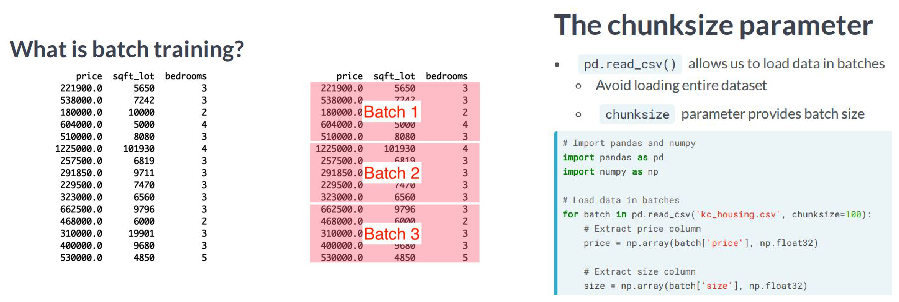

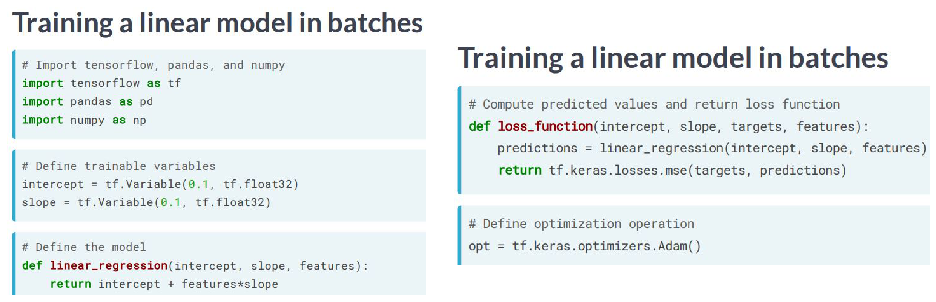

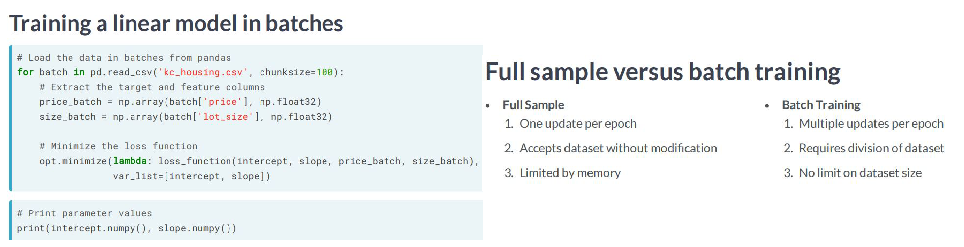

In [32]:
#vídeo
plot_2('batch1', 'batch2'); plot_2('batch3', 'batch4'); plot_2('batch5', 'batch6')

Exercício 12

In [33]:
# Preparing to batch train

# Define the intercept and slope
intercept = Variable(10.0, tf.float32)
slope = Variable(0.5, tf.float32)

# Define the model
def linear_regression(intercept, slope, features):
    # Define the predicted values
    return intercept + slope*features

# Define the loss function
def loss_function(intercept, slope, targets, features):
    # Define the predicted values
    predictions = linear_regression(intercept, slope, features)
    
    # Define the MSE loss
    return keras.losses.mse(targets, predictions)


Exercício 13

In [34]:
# Training a linear model in batches

# Initialize adam optimizer
opt = keras.optimizers.Adam()

# Load data in batches
for batch in pd.read_csv(data_folder + 'kc_house_data.csv', chunksize=100):
    size_batch = np.array(batch['sqft_lot'], np.float32)

    # Extract the price values for the current batch
    price_batch = np.array(batch['price'], np.float32)

    # Complete the loss, fill in the variable list, and minimize
    opt.minimize(lambda: loss_function(intercept, slope, price_batch, size_batch), var_list=[intercept, slope])

# Print trained parameters
print(intercept.numpy(), slope.numpy())

# Batch training will be very useful when you train neural networks, which we will do next.

10.217888 0.7016


# CHAPTER 3 - Neural Networks


The previous chapters taught you how to build models in TensorFlow 2.0. In this chapter, you will apply those same tools to build, train, and make predictions with neural networks. You will learn how to define dense layers, apply activation functions, select an optimizer, and apply regularization to reduce overfitting. You will take advantage of TensorFlow's flexibility by using both low-level linear algebra and high-level Keras API operations to define and train models.

#### Exercício 1 - Dense layers

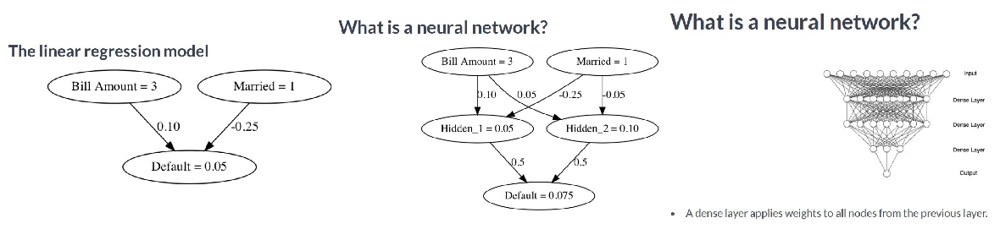

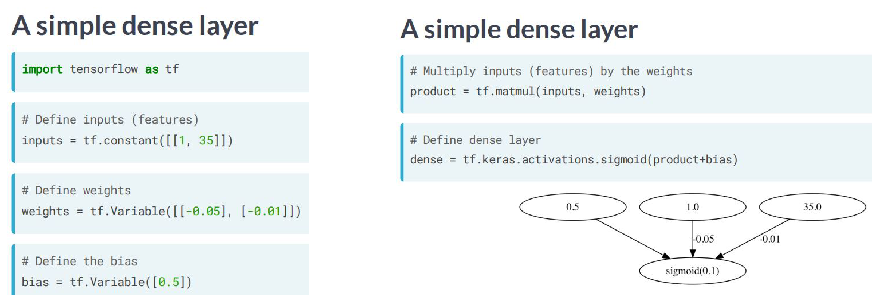

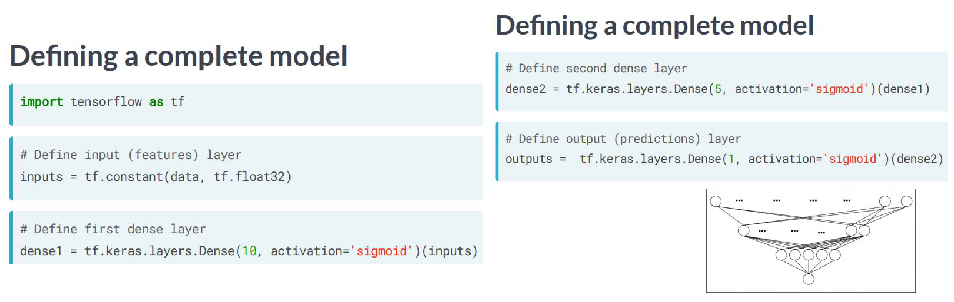

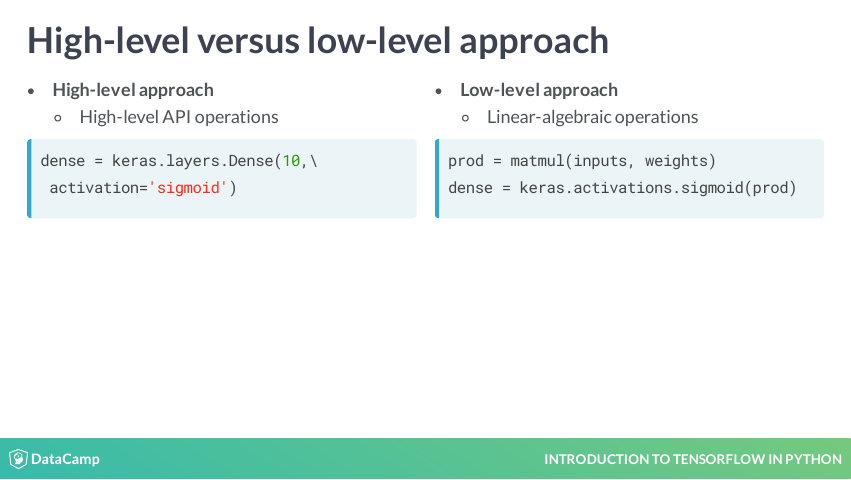

In [35]:
#vídeo
plot_3('linreg2', 'nn', 'nn1'); print("="*120); plot_2('dl', 'dl2'); print("="*120)
plot_2('cm', 'cm1'); print("="*120); display(pdf_3[8])

Exercício 2

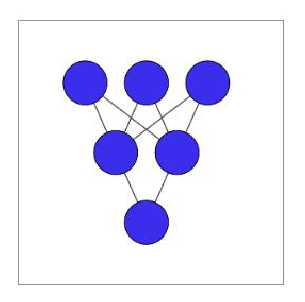

In [36]:
# The linear algebra of dense layers

from tensorflow import Variable, ones, matmul, keras

# There are two ways to define a dense layer in tensorflow. The first involves the use of low-level, linear algebraic
# operations. The second makes use of high-level keras operations. In this exercise, we will use the first method to 
# construct the network shown in the image below.

# 3 features -- education, marital status, and age -- which are available as borrower_features
borrower_features = np.array([[2., 2., 43.]], np.float32)

# The hidden layer contains 2 nodes and the output layer contains a single node.
plot_1('ex2')

In [37]:
# Initialize bias1
bias1 = Variable(1.0)

# Initialize weights1 as 3x2 variable of ones
weights1 = Variable(ones((3, 2)))

# Perform matrix multiplication of borrower_features and weights1 (1x3 x 3x2 = 1x2)
product1 = matmul(borrower_features, weights1)

# Apply sigmoid activation function to product1 + bias1
dense1 = keras.activations.sigmoid(product1 + bias1)

# Print shape of dense1
print("dense1's output shape: {}".format(dense1.shape))

dense1's output shape: (1, 2)


In [38]:
# Initialize bias2 and weights2
bias2 = Variable(1.0)
weights2 = Variable(ones((2, 1)))

# Perform matrix multiplication of dense1 and weights2
product2 = matmul(dense1, weights2)

# Apply activation to product2 + bias2 and print the prediction
prediction = keras.activations.sigmoid(product2 + bias2)
print('prediction: {}'.format(prediction.numpy()[0,0]))
print('actual: 1')

prediction: 0.9525741338729858
actual: 1


Exercício 3

In [39]:
# The low-level approach with multiple examples

borrower_features = np.array([[ 3.,  3., 23.], [ 2.,  1., 24.], [ 1.,  1., 49.], [ 1.,  1., 49.],
                              [ 2.,  1., 29.]], np.float32)
weights1 = np.array([[-0.6 ,  0.6 ], [ 0.8 , -0.3 ], [-0.09, -0.08]], np.float32)


# Compute the product of borrower_features and weights1
products1 = matmul(borrower_features, weights1)

# Apply a sigmoid activation function to products1 + bias1
dense1 = keras.activations.sigmoid(products1 + bias1)

# Print the shapes of borrower_features, weights1, bias1, and dense1
print('shape of borrower_features: ', borrower_features.shape)
print('shape of weights1: ', weights1.shape)
print('shape of bias1: ', bias1.shape)
print('shape of dense1: ', dense1.shape)

print("""\nNote that our input data, borrower_features, is 5x3 because it consists of 5 examples for 3 features. The shape
of weights1 is 3x2, as it was in the previous exercise, since it does not depend on the number of examples. Additionally, 
bias1 is a scalar. Finally, dense1 is 5x2, which means that we can multiply it by the following set of weights, weights2, 
which we defined to be 2x1 in the previous exercise.""")

shape of borrower_features:  (5, 3)
shape of weights1:  (3, 2)
shape of bias1:  ()
shape of dense1:  (5, 2)

Note that our input data, borrower_features, is 5x3 because it consists of 5 examples for 3 features. The shape
of weights1 is 3x2, as it was in the previous exercise, since it does not depend on the number of examples. Additionally, 
bias1 is a scalar. Finally, dense1 is 5x2, which means that we can multiply it by the following set of weights, weights2, 
which we defined to be 2x1 in the previous exercise.


Exercício 4

We've now seen how to define dense layers in tensorflow using linear algebra. In this exercise, we'll skip the 
linear algebra and let keras work out the details. This will allow us to construct the network below, which has 2 hidden 
layers and 10 features, using less code than we needed for the network with 1 hidden layer and 3 features.


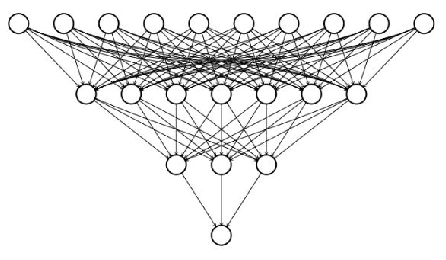

In [40]:
# Using the dense layer operation

print("""We've now seen how to define dense layers in tensorflow using linear algebra. In this exercise, we'll skip the 
linear algebra and let keras work out the details. This will allow us to construct the network below, which has 2 hidden 
layers and 10 features, using less code than we needed for the network with 1 hidden layer and 3 features.""")
plot_1('dense')

borrower_features = np.array([[6.96469188e-01, 2.86139339e-01, 2.26851448e-01, 5.51314771e-01,
        7.19468951e-01, 4.23106462e-01, 9.80764210e-01, 6.84829712e-01,
        4.80931908e-01, 3.92117530e-01],
       [3.43178004e-01, 7.29049683e-01, 4.38572258e-01, 5.96778952e-02,
        3.98044258e-01, 7.37995386e-01, 1.82491735e-01, 1.75451756e-01,
        5.31551361e-01, 5.31827569e-01],
       [6.34400964e-01, 8.49431813e-01, 7.24455297e-01, 6.11023486e-01,
        7.22443402e-01, 3.22958916e-01, 3.61788660e-01, 2.28263229e-01,
        2.93714046e-01, 6.30976140e-01],
       [9.21049416e-02, 4.33701187e-01, 4.30862755e-01, 4.93685097e-01,
        4.25830305e-01, 3.12261224e-01, 4.26351309e-01, 8.93389165e-01,
        9.44160044e-01, 5.01836658e-01],
       [6.23952925e-01, 1.15618393e-01, 3.17285478e-01, 4.14826214e-01,
        8.66309166e-01, 2.50455379e-01, 4.83034253e-01, 9.85559762e-01,
        5.19485116e-01, 6.12894535e-01],
       [1.20628662e-01, 8.26340795e-01, 6.03060126e-01, 5.45068026e-01,
        3.42763841e-01, 3.04120779e-01, 4.17022198e-01, 6.81300759e-01,
        8.75456870e-01, 5.10422349e-01],
       [6.69313788e-01, 5.85936546e-01, 6.24903500e-01, 6.74689054e-01,
        8.42342436e-01, 8.31949860e-02, 7.63682842e-01, 2.43666381e-01,
        1.94222957e-01, 5.72456956e-01],
       [9.57125202e-02, 8.85326803e-01, 6.27248943e-01, 7.23416328e-01,
        1.61292069e-02, 5.94431877e-01, 5.56785166e-01, 1.58959642e-01,
        1.53070509e-01, 6.95529521e-01],
       [3.18766415e-01, 6.91970289e-01, 5.54383278e-01, 3.88950586e-01,
        9.25132513e-01, 8.41669977e-01, 3.57397556e-01, 4.35914621e-02,
        3.04768085e-01, 3.98185670e-01],
       [7.04958856e-01, 9.95358467e-01, 3.55914861e-01, 7.62547791e-01,
        5.93176901e-01, 6.91701770e-01, 1.51127458e-01, 3.98876280e-01,
        2.40855902e-01, 3.43456000e-01],
       [5.13128161e-01, 6.66624546e-01, 1.05908483e-01, 1.30894944e-01,
        3.21980596e-01, 6.61564350e-01, 8.46506238e-01, 5.53257346e-01,
        8.54452491e-01, 3.84837806e-01],
       [3.16787899e-01, 3.54264677e-01, 1.71081826e-01, 8.29112649e-01,
        3.38670850e-01, 5.52370071e-01, 5.78551471e-01, 5.21533072e-01,
        2.68806447e-03, 9.88345444e-01],
       [9.05341566e-01, 2.07635865e-01, 2.92489409e-01, 5.20010173e-01,
        9.01911378e-01, 9.83630896e-01, 2.57542074e-01, 5.64359069e-01,
        8.06968689e-01, 3.94370049e-01],
       [7.31073022e-01, 1.61069021e-01, 6.00698590e-01, 8.65864456e-01,
        9.83521581e-01, 7.93657899e-02, 4.28347290e-01, 2.04542860e-01,
        4.50636476e-01, 5.47763586e-01],
       [9.33267102e-02, 2.96860784e-01, 9.27584231e-01, 5.69003761e-01,
        4.57412004e-01, 7.53525972e-01, 7.41862178e-01, 4.85790335e-02,
        7.08697379e-01, 8.39243352e-01],
       [1.65937886e-01, 7.80997932e-01, 2.86536604e-01, 3.06469738e-01,
        6.65261447e-01, 1.11392170e-01, 6.64872468e-01, 8.87856781e-01,
        6.96311295e-01, 4.40327883e-01],
       [4.38214391e-01, 7.65096068e-01, 5.65641999e-01, 8.49041641e-02,
        5.82671106e-01, 8.14843714e-01, 3.37066382e-01, 9.27576602e-01,
        7.50716984e-01, 5.74063838e-01],
       [7.51644015e-01, 7.91489631e-02, 8.59389067e-01, 8.21504116e-01,
        9.09871638e-01, 1.28631204e-01, 8.17800835e-02, 1.38415575e-01,
        3.99378717e-01, 4.24306870e-01],
       [5.62218368e-01, 1.22243546e-01, 2.01399505e-01, 8.11644375e-01,
        4.67987567e-01, 8.07938218e-01, 7.42637832e-03, 5.51592708e-01,
        9.31932151e-01, 5.82175434e-01],
       [2.06095725e-01, 7.17757583e-01, 3.78985852e-01, 6.68383956e-01,
        2.93197222e-02, 6.35900378e-01, 3.21979336e-02, 7.44780660e-01,
        4.72912997e-01, 1.21754356e-01],
       [5.42635918e-01, 6.67744428e-02, 6.53364897e-01, 9.96086299e-01,
        7.69397318e-01, 5.73774099e-01, 1.02635257e-01, 6.99834049e-01,
        6.61167860e-01, 4.90971319e-02],
       [7.92299330e-01, 5.18716574e-01, 4.25867707e-01, 7.88187146e-01,
        4.11569238e-01, 4.81026262e-01, 1.81628838e-01, 3.21318895e-01,
        8.45533013e-01, 1.86903745e-01],
       [4.17291075e-01, 9.89034534e-01, 2.36599818e-01, 9.16832328e-01,
        9.18397486e-01, 9.12963450e-02, 4.63652730e-01, 5.02216339e-01,
        3.13668936e-01, 4.73395362e-02],
       [2.41685644e-01, 9.55296382e-02, 2.38249913e-01, 8.07791114e-01,
        8.94978285e-01, 4.32228930e-02, 3.01946849e-01, 9.80582178e-01,
        5.39504826e-01, 6.26309335e-01],
       [5.54540846e-03, 4.84909445e-01, 9.88328516e-01, 3.75185519e-01,
        9.70381573e-02, 4.61908758e-01, 9.63004470e-01, 3.41830611e-01,
        7.98922718e-01, 7.98846304e-01],
       [2.08248302e-01, 4.43367690e-01, 7.15601265e-01, 4.10519779e-01,
        1.91006958e-01, 9.67494309e-01, 6.50750339e-01, 8.65459859e-01,
        2.52423584e-02, 2.66905814e-01],
       [5.02071083e-01, 6.74486384e-02, 9.93033290e-01, 2.36462399e-01,
        3.74292195e-01, 2.14011908e-01, 1.05445869e-01, 2.32479781e-01,
        3.00610125e-01, 6.34442270e-01],
       [2.81234771e-01, 3.62276763e-01, 5.94284385e-03, 3.65719140e-01,
        5.33885956e-01, 1.62015840e-01, 5.97433090e-01, 2.93152481e-01,
        6.32050514e-01, 2.61966046e-02],
       [8.87593448e-01, 1.61186308e-02, 1.26958027e-01, 7.77162433e-01,
        4.58952338e-02, 7.10998714e-01, 9.71046150e-01, 8.71682942e-01,
        7.10161626e-01, 9.58509743e-01],
       [4.29813325e-01, 8.72878909e-01, 3.55957657e-01, 9.29763675e-01,
        1.48777649e-01, 9.40029025e-01, 8.32716227e-01, 8.46054852e-01,
        1.23923011e-01, 5.96486926e-01],
       [1.63924806e-02, 7.21184373e-01, 7.73751410e-03, 8.48222747e-02,
        2.25498408e-01, 8.75124514e-01, 3.63576323e-01, 5.39959908e-01,
        5.68103194e-01, 2.25463361e-01],
       [5.72146773e-01, 6.60951793e-01, 2.98245400e-01, 4.18626845e-01,
        4.53088939e-01, 9.32350636e-01, 5.87493777e-01, 9.48252380e-01,
        5.56034744e-01, 5.00561416e-01],
       [3.53221106e-03, 4.80889052e-01, 9.27455008e-01, 1.98365688e-01,
        5.20911328e-02, 4.06778902e-01, 3.72396469e-01, 8.57153058e-01,
        2.66111158e-02, 9.20149207e-01],
       [6.80903018e-01, 9.04226005e-01, 6.07529044e-01, 8.11953306e-01,
        3.35543871e-01, 3.49566221e-01, 3.89874220e-01, 7.54797101e-01,
        3.69291186e-01, 2.42219806e-01],
       [9.37668383e-01, 9.08011079e-01, 3.48797321e-01, 6.34638071e-01,
        2.73842216e-01, 2.06115127e-01, 3.36339533e-01, 3.27099890e-01,
        8.82276118e-01, 8.22303832e-01],
       [7.09623218e-01, 9.59345222e-01, 4.22543347e-01, 2.45033041e-01,
        1.17398441e-01, 3.01053345e-01, 1.45263731e-01, 9.21861008e-02,
        6.02932215e-01, 3.64187449e-01],
       [5.64570367e-01, 1.91335723e-01, 6.76905870e-01, 2.15505451e-01,
        2.78023601e-01, 7.41760433e-01, 5.59737921e-01, 3.34836423e-01,
        5.42988777e-01, 6.93984687e-01],
       [9.12132144e-01, 5.80713212e-01, 2.32686386e-01, 7.46697605e-01,
        7.77769029e-01, 2.00401321e-01, 8.20574224e-01, 4.64934856e-01,
        7.79766679e-01, 2.37478226e-01],
       [3.32580268e-01, 9.53697145e-01, 6.57815099e-01, 7.72877812e-01,
        6.88374341e-01, 2.04304114e-01, 4.70688760e-01, 8.08963895e-01,
        6.75035119e-01, 6.02788571e-03],
       [8.74077454e-02, 3.46794724e-01, 9.44365561e-01, 4.91190493e-01,
        2.70176262e-01, 3.60423714e-01, 2.10652635e-01, 4.21200067e-01,
        2.18035445e-01, 8.45752478e-01],
       [4.56270605e-01, 2.79802024e-01, 9.32891667e-01, 3.14351350e-01,
        9.09714639e-01, 4.34180908e-02, 7.07115054e-01, 4.83889043e-01,
        4.44221050e-01, 3.63233462e-02],
       [4.06831913e-02, 3.32753628e-01, 9.47119534e-01, 6.17659986e-01,
        3.68874848e-01, 6.11977041e-01, 2.06131533e-01, 1.65066436e-01,
        3.61817271e-01, 8.63353372e-01],
       [5.09401739e-01, 2.96901524e-01, 9.50251639e-01, 8.15966070e-01,
        3.22973937e-01, 9.72098231e-01, 9.87351120e-01, 4.08660144e-01,
        6.55923128e-01, 4.05653208e-01],
       [2.57348120e-01, 8.26526731e-02, 2.63610333e-01, 2.71479845e-01,
        3.98639083e-01, 1.84886038e-01, 9.53818381e-01, 1.02879882e-01,
        6.25208557e-01, 4.41697389e-01],
       [4.23518062e-01, 3.71991783e-01, 8.68314683e-01, 2.80476987e-01,
        2.05761567e-02, 9.18097019e-01, 8.64480257e-01, 2.76901782e-01,
        5.23487568e-01, 1.09088197e-01],
       [9.34270695e-02, 8.37466121e-01, 4.10265714e-01, 6.61716521e-01,
        9.43200588e-01, 2.45130599e-01, 1.31598311e-02, 2.41484065e-02,
        7.09385693e-01, 9.24551904e-01],
       [4.67330277e-01, 3.75109136e-01, 5.42860448e-01, 8.58916819e-01,
        6.52153850e-01, 2.32979894e-01, 7.74580181e-01, 1.34613499e-01,
        1.65559977e-01, 6.12682283e-01],
       [2.38783404e-01, 7.04778552e-01, 3.49518538e-01, 2.77423948e-01,
        9.98918414e-01, 4.06161249e-02, 6.45822525e-01, 3.86995859e-02,
        7.60210276e-01, 2.30089962e-01],
       [8.98318663e-02, 6.48449719e-01, 7.32601225e-01, 6.78095341e-01,
        5.19009456e-02, 2.94306934e-01, 4.51088339e-01, 2.87103295e-01,
        8.10513437e-01, 1.31115109e-01],
       [6.12179339e-01, 9.88214970e-01, 9.02556539e-01, 2.22157061e-01,
        8.18876142e-05, 9.80597317e-01, 8.82712960e-01, 9.19472456e-01,
        4.15503561e-01, 7.44615436e-01],
       [2.12831497e-01, 3.92304063e-01, 8.51548076e-01, 1.27612218e-01,
        8.93865347e-01, 4.96507972e-01, 4.26095665e-01, 3.05646390e-01,
        9.16848779e-01, 5.17623484e-01],
       [8.04026365e-01, 8.57651770e-01, 9.22382355e-01, 3.03380728e-01,
        3.39810848e-01, 5.95073879e-01, 4.41324145e-01, 9.32842553e-01,
        3.97564054e-01, 4.77778047e-01],
       [6.17186069e-01, 4.04739499e-01, 9.92478430e-01, 9.88512859e-02,
        2.20603317e-01, 3.22655141e-01, 1.47722840e-01, 2.84219235e-01,
        7.79245317e-01, 5.22891998e-01],
       [3.39536369e-02, 9.82622564e-01, 6.16006494e-01, 5.89394793e-02,
        6.61168754e-01, 3.78369361e-01, 1.35673299e-01, 5.63664615e-01,
        7.27079928e-01, 6.71126604e-01],
       [2.47513160e-01, 5.24866223e-01, 5.37663460e-01, 7.16803372e-01,
        3.59867334e-01, 7.97732592e-01, 6.27921820e-01, 3.83316055e-02,
        5.46479046e-01, 8.61912072e-01],
       [5.67574143e-01, 1.75828263e-01, 5.10376394e-01, 7.56945848e-01,
        1.10105194e-01, 8.17099094e-01, 1.67481646e-01, 5.34076512e-01,
        3.85743469e-01, 2.48623773e-01],
       [6.47432506e-01, 3.73921096e-02, 7.60045826e-01, 5.26940644e-01,
        8.75771224e-01, 5.20718336e-01, 3.50331701e-02, 1.43600971e-01,
        7.95604587e-01, 4.91976053e-01],
       [4.41879272e-01, 3.18434775e-01, 2.84549206e-01, 9.65886295e-01,
        4.32969332e-01, 8.84003043e-01, 6.48163140e-01, 8.58427644e-01,
        8.52449536e-01, 9.56312001e-01],
       [6.97942257e-01, 8.05396914e-01, 7.33127892e-01, 6.05226815e-01,
        7.17354119e-01, 7.15750396e-01, 4.09077927e-02, 5.16110837e-01,
        7.92651355e-01, 2.42962182e-01],
       [4.65147972e-01, 4.34985697e-01, 4.02787179e-01, 1.21839531e-01,
        5.25711536e-01, 4.46248353e-01, 6.63392782e-01, 5.49413085e-01,
        2.75429301e-02, 3.19179893e-02],
       [7.01359808e-01, 7.07581103e-01, 9.59939122e-01, 8.76704693e-01,
        4.68059659e-01, 6.25906527e-01, 4.57181722e-01, 2.22946241e-01,
        3.76677006e-01, 1.03884235e-01],
       [6.66527092e-01, 1.92030147e-01, 4.75467801e-01, 9.67436612e-01,
        3.16689312e-02, 1.51729956e-01, 2.98579186e-01, 9.41806972e-01,
        9.08841789e-01, 1.62000835e-01],
       [9.81117785e-01, 7.50747502e-01, 5.39977074e-01, 9.31702912e-01,
        8.80607128e-01, 3.91316503e-01, 6.56343222e-01, 6.47385120e-01,
        3.26968193e-01, 1.79390177e-01],
       [4.66809869e-01, 2.63281047e-01, 3.55065137e-01, 9.54143941e-01,
        4.61137861e-01, 6.84891462e-01, 3.36229891e-01, 9.95861053e-01,
        6.58767581e-01, 1.96009472e-01],
       [9.81839970e-02, 9.43180561e-01, 9.44777846e-01, 6.21328354e-01,
        1.69914998e-02, 2.25534886e-01, 8.01276803e-01, 8.75459850e-01,
        4.53989804e-01, 3.65520626e-01],
       [2.74224997e-01, 1.16970517e-01, 1.15744539e-01, 9.52602684e-01,
        8.08626115e-01, 1.64779365e-01, 2.07050055e-01, 6.55551553e-01,
        7.64664233e-01, 8.10314834e-01],
       [1.63337693e-01, 9.84128296e-01, 2.27802068e-01, 5.89415431e-01,
        5.87615728e-01, 9.67361867e-01, 6.57667458e-01, 5.84904253e-01,
        5.18772602e-01, 7.64657557e-01],
       [1.06055260e-01, 2.09190114e-03, 9.52488840e-01, 4.98657674e-01,
        3.28335375e-01, 3.68053257e-01, 8.03843319e-01, 3.82370204e-01,
        7.70169199e-01, 4.40461993e-01],
       [8.44077468e-01, 7.62040615e-02, 4.81128335e-01, 4.66849715e-01,
        2.64327973e-01, 9.43614721e-01, 9.05028462e-01, 4.43596303e-01,
        9.71596092e-02, 2.06783146e-01],
       [2.71491826e-01, 4.84219760e-01, 3.38377118e-01, 7.74136066e-01,
        4.76026595e-01, 8.70370507e-01, 9.95781779e-01, 2.19835952e-01,
        6.11671388e-01, 8.47502291e-01],
       [9.45236623e-01, 2.90086418e-01, 7.27042735e-01, 1.50161488e-02,
        8.79142463e-01, 6.39385507e-02, 7.33395398e-01, 9.94610369e-01,
        5.01189768e-01, 2.09333986e-01],
       [5.94643593e-01, 6.24149978e-01, 6.68072760e-01, 1.72611743e-01,
        8.98712695e-01, 6.20991349e-01, 4.35687043e-02, 6.84041083e-01,
        1.96084052e-01, 2.73407809e-02],
       [5.50953269e-01, 8.13313663e-01, 8.59941125e-01, 1.03520922e-01,
        6.63042784e-01, 7.10075200e-01, 2.94516981e-01, 9.71364021e-01,
        2.78687477e-01, 6.99821860e-02],
       [5.19280374e-01, 6.94314897e-01, 2.44659781e-01, 3.38582188e-01,
        5.63627958e-01, 8.86678159e-01, 7.47325897e-01, 2.09591955e-01,
        2.51777083e-01, 5.23880661e-01],
       [7.68958688e-01, 6.18761778e-01, 5.01324296e-01, 5.97125351e-01,
        7.56060004e-01, 5.37079811e-01, 8.97752762e-01, 9.47067499e-01,
        9.15354490e-01, 7.54518330e-01],
       [2.46321008e-01, 3.85271460e-01, 2.79999942e-01, 6.57660246e-01,
        3.24221611e-01, 7.54391611e-01, 1.13509081e-01, 7.75364757e-01,
        5.85901976e-01, 8.35388660e-01],
       [4.30875659e-01, 6.24964476e-01, 5.54412127e-01, 9.75671291e-01,
        7.55474389e-01, 5.44813275e-01, 1.74032092e-01, 9.04114246e-01,
        2.05837786e-01, 6.50043249e-01],
       [9.36471879e-01, 2.23579630e-01, 2.25923538e-01, 8.51818919e-01,
        8.27655017e-01, 3.51703346e-01, 2.65096277e-01, 1.27388477e-01,
        9.87936080e-01, 8.35343122e-01],
       [8.99391592e-01, 5.13679326e-01, 1.14384830e-01, 5.25803380e-02,
        3.30582112e-01, 9.20330405e-01, 9.47581828e-01, 8.41163874e-01,
        1.58679143e-01, 4.19923156e-01],
       [2.46242926e-01, 2.05349773e-01, 6.84825838e-01, 4.86111671e-01,
        3.24909657e-01, 1.00214459e-01, 5.44763386e-01, 3.47025156e-01,
        3.91095817e-01, 3.10508728e-01],
       [3.87195200e-01, 5.55859566e-01, 1.41438060e-02, 8.47647011e-01,
        9.21919882e-01, 5.50529718e-01, 2.68021107e-01, 9.90239024e-01,
        3.83194029e-01, 6.93655372e-01],
       [6.89952552e-01, 4.34309065e-01, 1.99158162e-01, 9.66579378e-01,
        6.36908561e-02, 4.85149384e-01, 2.20730707e-01, 2.93974131e-01,
        8.28527331e-01, 3.67265552e-01],
       [8.33482668e-02, 1.96309000e-01, 8.60373437e-01, 9.77028847e-01,
        2.67982155e-01, 6.75408959e-01, 8.11989978e-02, 7.23465621e-01,
        4.16436613e-01, 9.18159902e-01],
       [3.11536163e-01, 9.41466987e-01, 5.03247440e-01, 3.48892927e-01,
        6.47019625e-01, 2.49746203e-01, 2.29763597e-01, 1.96346447e-01,
        9.59899545e-01, 4.92913723e-01],
       [7.51614988e-01, 4.73991871e-01, 5.87540150e-01, 5.84138989e-01,
        9.79886293e-01, 6.68433130e-01, 2.39769474e-01, 1.51976589e-02,
        2.18682140e-01, 4.55519646e-01],
       [3.93420339e-01, 8.12326252e-01, 7.85556734e-01, 8.90959650e-02,
        9.52010751e-01, 5.27456701e-01, 5.96403956e-01, 4.05056775e-01,
        6.49500966e-01, 8.71326327e-01],
       [6.73935950e-01, 9.70098555e-01, 7.01122224e-01, 8.21720719e-01,
        4.50395830e-02, 6.72698498e-01, 6.54752672e-01, 1.01746053e-01,
        8.42387497e-01, 6.14172399e-01],
       [9.83280912e-02, 5.94467103e-01, 4.78415847e-01, 2.33293563e-01,
        1.97560899e-02, 3.65567267e-01, 6.19851053e-01, 3.29279125e-01,
        3.07254642e-01, 7.51121223e-01],
       [7.58624673e-01, 7.18765855e-01, 1.01181954e-01, 5.16165972e-01,
        5.57798684e-01, 7.44804502e-01, 9.03177738e-01, 3.69038880e-01,
        4.28663462e-01, 7.32767463e-01],
       [6.62636399e-01, 5.57869911e-01, 3.50139618e-01, 1.95352346e-01,
        1.83807373e-01, 8.15832913e-02, 8.12008530e-02, 8.45798194e-01,
        3.83672744e-01, 6.07396215e-02],
       [8.96425664e-01, 2.23270476e-01, 2.68124431e-01, 1.94497839e-01,
        9.67501044e-01, 1.12540089e-01, 7.22163260e-01, 9.32088733e-01,
        6.68001294e-01, 8.58726621e-01],
       [2.42447108e-01, 6.73927963e-01, 7.00871348e-01, 4.58332509e-01,
        8.70545626e-01, 6.94386125e-01, 8.94877791e-01, 7.53204346e-01,
        5.20290434e-01, 4.98688221e-01],
       [4.53727633e-01, 2.16468628e-02, 5.35141408e-01, 4.22973245e-01,
        1.57533601e-01, 1.19069695e-01, 4.49351877e-01, 3.99130546e-02,
        9.86579895e-01, 3.78120929e-01],
       [3.82109195e-01, 5.11263013e-02, 4.26672339e-01, 1.57454368e-02,
        3.00936326e-02, 3.39099228e-01, 8.20968926e-01, 4.58821088e-01,
        1.48405796e-02, 1.63220033e-01],
       [7.39922702e-01, 7.38293707e-01, 7.54522920e-01, 3.51669371e-01,
        3.52276951e-01, 8.02075684e-01, 3.98137897e-01, 7.27191031e-01,
        5.81122994e-01, 3.64341676e-01],
       [8.00065175e-02, 1.16125375e-01, 8.89558733e-01, 4.52340513e-01,
        9.94004548e-01, 3.63896936e-01, 2.49954298e-01, 3.50539327e-01,
        3.43086094e-01, 6.37356758e-01],
       [1.27375638e-02, 7.63268650e-01, 4.16414618e-01, 4.32239205e-01,
        4.81115013e-01, 4.49212462e-01, 4.97470886e-01, 3.45904320e-01,
        4.53346133e-01, 4.04651344e-01],
       [5.18242717e-01, 6.23269081e-01, 2.41040602e-01, 5.08437157e-01,
        5.94621897e-01, 1.69483144e-02, 5.20493746e-01, 2.39293247e-01,
        4.04538542e-01, 8.26530159e-01],
       [3.26235592e-01, 4.83216912e-01, 2.47411542e-02, 3.08750868e-01,
        6.39721096e-01, 3.15161765e-01, 2.05797508e-01, 2.90655673e-01,
        9.54378307e-01, 8.68018195e-02],
       [4.63357776e-01, 5.83869033e-02, 5.38658261e-01, 1.46035731e-01,
        6.34084821e-01, 2.64397472e-01, 6.90915406e-01, 3.47146064e-01,
        4.16848855e-03, 2.94894695e-01]], np.float32)

In [41]:
# Using the dense layer operation

# Define the first dense layer
dense1 = keras.layers.Dense(7, activation='sigmoid')(borrower_features)

# Define a dense layer with 3 output nodes
dense2 = keras.layers.Dense(3, activation='sigmoid')(dense1)

# Define a dense layer with 1 output node
predictions = keras.layers.Dense(1, activation='sigmoid')(dense2)

# Print the shapes of dense1, dense2, and predictions
print('shape of dense1: ', dense1.shape)
print('shape of dense2: ', dense2.shape)
print('shape of predictions: ', predictions.shape)

print("""\nWith just 8 lines of code, you were able to define 2 dense hidden layers and an output layer. This is the 
advantage of using high-level operations in tensorflow. Note that each layer has 100 rows because the input data contains
100 examples.""")

shape of dense1:  (100, 7)
shape of dense2:  (100, 3)
shape of predictions:  (100, 1)

With just 8 lines of code, you were able to define 2 dense hidden layers and an output layer. This is the 
advantage of using high-level operations in tensorflow. Note that each layer has 100 rows because the input data contains
100 examples.


#### Exercício 5 - Activation functions

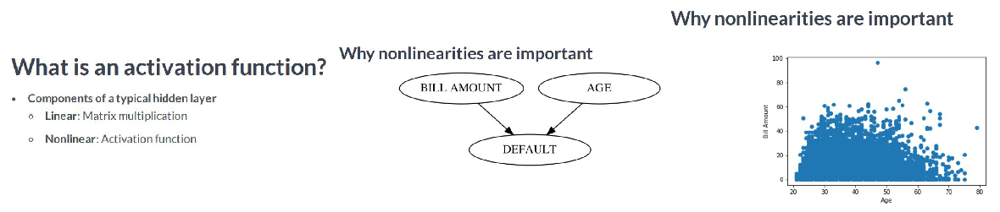

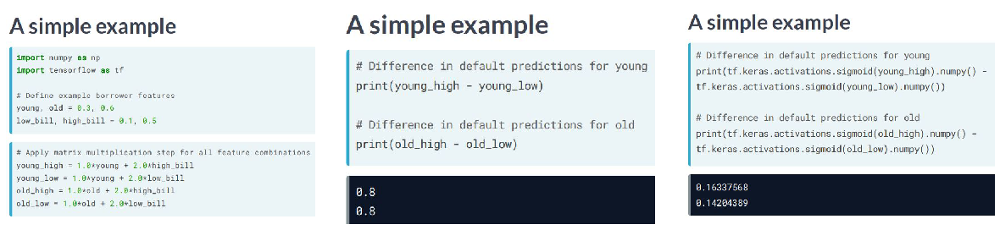

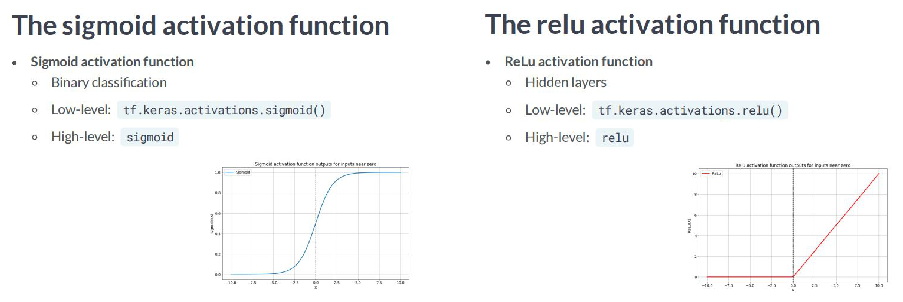

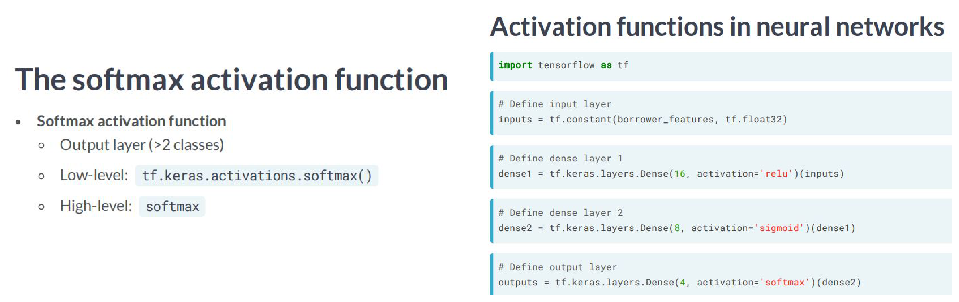

In [42]:
#vídeo
plot_3('activation', 'nonlinear', 'nonlinear2'); print("="*120); plot_3('ex_s', 'ex_s2', 'ex_s3', wspace=0.1); 
print("="*120); plot_2('sigmoid', 'relu'); plot_2('softmax', 'activation_f')

Exercício 6

In [43]:
# Binary classification problems

bill_amounts = np.array(credit[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3']].copy(), np.float32)
default = np.array(credit['default.payment.next.month'].copy(), np.float32)

#############

# Construct input layer from features
inputs = constant(bill_amounts, np.float32)

# Define first dense layer
dense1 = keras.layers.Dense(3, activation='relu')(inputs)

# Define second dense layer
dense2 = keras.layers.Dense(2, activation='relu')(dense1)

# Define output layer
outputs = keras.layers.Dense(1, activation='sigmoid')(dense2)

# Print error for first five examples
error = default[:5] - outputs.numpy()[:5]
print(error)
print("""\nIf you run the code several times, you'll notice that the errors change each time. This is because you're using 
an untrained model with randomly initialized parameters. Furthermore, the errors fall on the interval between -1 and 1 
because default is a binary variable that takes on values of 0 and 1 and outputs is a probability between 0 and 1.""")

[[ 0.5  0.5 -0.5 -0.5 -0.5]
 [ 0.5  0.5 -0.5 -0.5 -0.5]
 [ 0.5  0.5 -0.5 -0.5 -0.5]
 [ 0.5  0.5 -0.5 -0.5 -0.5]
 [ 0.5  0.5 -0.5 -0.5 -0.5]]

If you run the code several times, you'll notice that the errors change each time. This is because you're using 
an untrained model with randomly initialized parameters. Furthermore, the errors fall on the interval between -1 and 1 
because default is a binary variable that takes on values of 0 and 1 and outputs is a probability between 0 and 1.


Exercício 7

In [44]:
# Multiclass classification problems

# In this exercise, we expand beyond binary classification to cover multiclass problems

display(credit['EDUCATION'].value_counts())

# columns 'BILL_AMT1' till 'PAY_AMT6'
select_columns = credit.columns[12:22]

borrower_features = np.array(credit[select_columns].copy(), np.float32)
target = np.array(credit['EDUCATION'].copy(), np.float32)

##################

# Construct input layer from borrower features
inputs = constant(borrower_features, np.float32)

# Define first dense layer
dense1 = keras.layers.Dense(10, activation='sigmoid')(inputs)

# Define second dense layer
dense2 = keras.layers.Dense(8, activation='relu')(dense1)

# Define output layer
outputs = keras.layers.Dense(6, activation='softmax')(dense2)

# Print first five predictions
print(outputs.numpy()[:5])
print("""\nNotice that each row of outputs sums to one. This is because a row contains the predicted class probabilities 
for one example. As with the previous exercise, our predictions are not yet informative, since we are using an untrained 
model with randomly initialized parameters. This is why the model tends to assign similar probabilities to each class.""")

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

[[0.07297187 0.25283152 0.10053357 0.09416404 0.15197521 0.3275238 ]
 [0.09925055 0.23278603 0.12552586 0.12169856 0.13205497 0.28868407]
 [0.09925055 0.23278603 0.12552586 0.12169856 0.13205497 0.28868407]
 [0.05716017 0.28462484 0.08818184 0.08163857 0.10285929 0.38553527]
 [0.09925163 0.15961751 0.14732848 0.127023   0.20754278 0.25923672]]

Notice that each row of outputs sums to one. This is because a row contains the predicted class probabilities 
for one example. As with the previous exercise, our predictions are not yet informative, since we are using an untrained 
model with randomly initialized parameters. This is why the model tends to assign similar probabilities to each class.


#### Exercício 8 - Optimizers

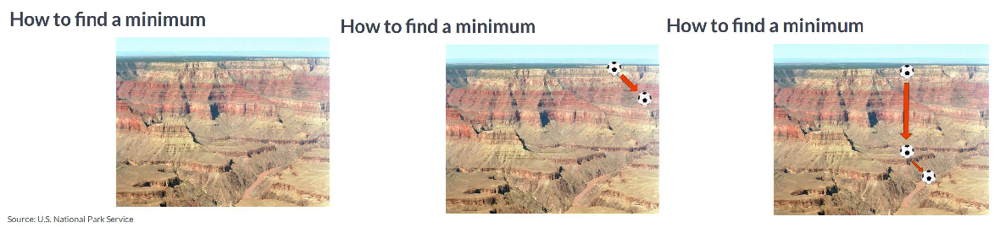

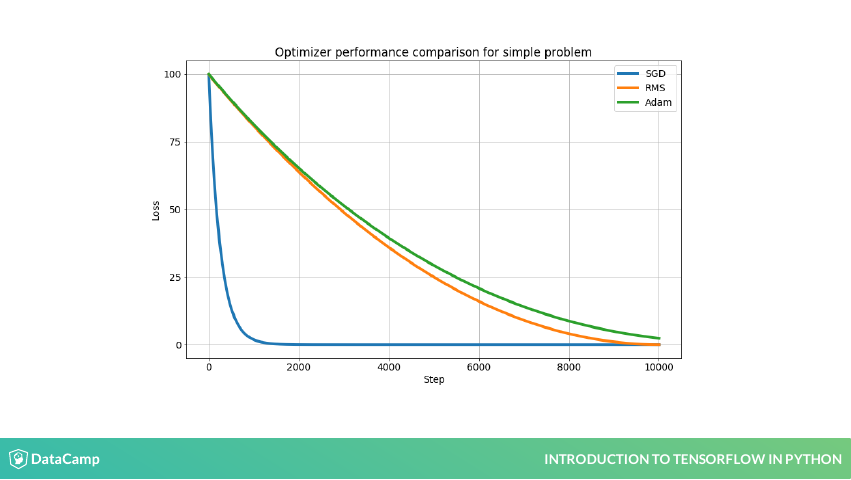

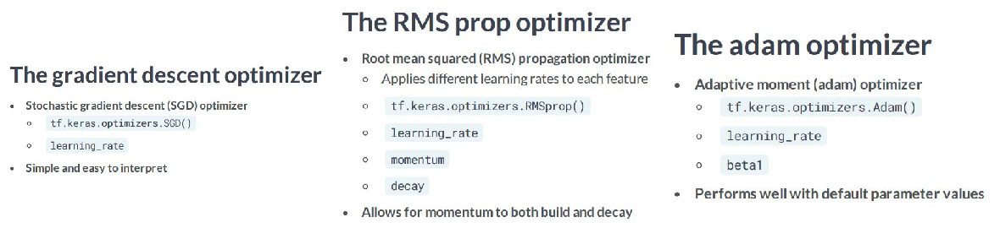

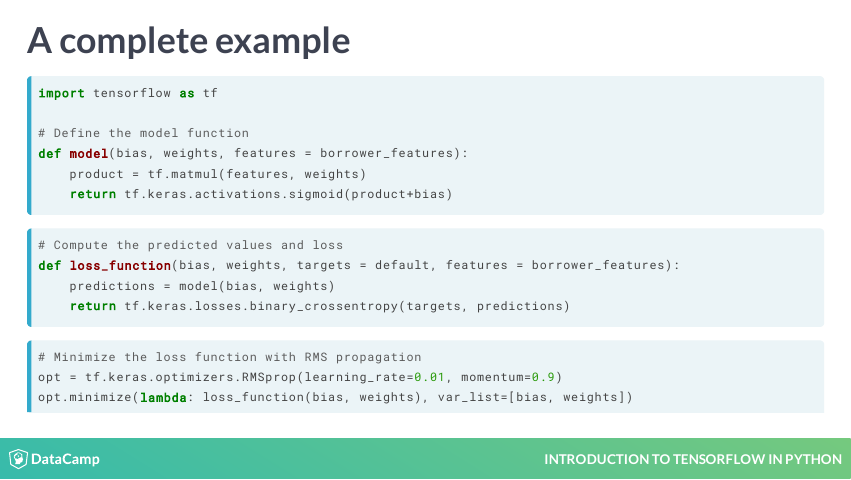

In [45]:
#vídeo
plot_3('min', 'min1', 'min2'); display(pdf_3[26]); print("="*120); plot_3('gd', 'RMSprop', 'adam'); print("="*120);
display(pdf_3[30])

Exercício 9

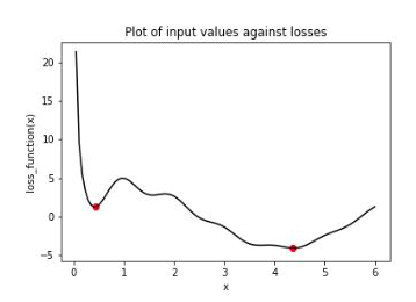

C:\Users\Admin\anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in double_scalars


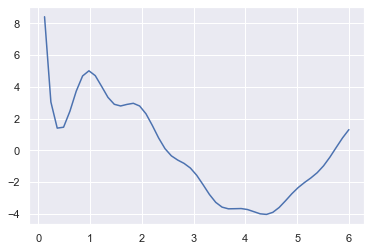

In [46]:
# The dangers of local minima

import math

# Consider the plot of the following loss function, loss_function(), which contains a global minimum, marked by the dot on
# the right, and several local minima, including the one marked by the dot on the left.
plot_1('local_min')

# In this exercise, you will try to find the global minimum of loss_function() using keras.optimizers.SGD(). 

# You will do this twice, each time with a different initial value of the input to loss_function(). 
# First, you will use x_1, which is a variable with an initial value of 6.0. 
# Second, you will use x_2, which is a variable with an initial value of 0.3. 
# Note that loss_function() has been defined and is available.

def loss_function(x):
    return 4.0*math.cos(x-1) + math.cos(2.0*math.pi*x)/x

x = np.linspace(0, 6)

plt.plot(x, [loss_function(i) for i in x])
plt.show()

In [47]:
# The dangers of local minima

# Initialize x_1 and x_2
x_1 = Variable(6.0, np.float32)
x_2 = Variable(0.3, np.float32)

# Define the optimization operation
opt = keras.optimizers.SGD(learning_rate=0.01)

for j in range(100):
    # Perform minimization using the loss function and x_1
    opt.minimize(lambda: loss_function(x_1), var_list=[x_1])
    # Perform minimization using the loss function and x_2
    opt.minimize(lambda: loss_function(x_2), var_list=[x_2])

# Print x_1 and x_2 as numpy arrays
print(x_1.numpy(), x_2.numpy())

print("""\nNotice that we used the same optimizer and loss function, but two different initial values. When we started at
6.0 with x_1, we found the global minimum at {}. When we started at 0.3, we stopped around {} with x_2.""".format(
round(x_1.numpy(), 3), round(x_2.numpy(), 3)))

6.027515 0.25

Notice that we used the same optimizer and loss function, but two different initial values. When we started at
6.0 with x_1, we found the global minimum at 6.0279998779296875. When we started at 0.3, we stopped around 0.25 with x_2.


Exercício 10

In [48]:
# Avoiding local minima

# Initialize x_1 and x_2
x_1 = Variable(0.05, np.float32)
x_2 = Variable(0.05, np.float32)

# Define the optimization operation for opt_1 and opt_2
opt_1 = keras.optimizers.RMSprop(learning_rate=0.01, momentum=0.99)
opt_2 = keras.optimizers.RMSprop(learning_rate=0.01, momentum=0.00)

for j in range(100):
    opt_1.minimize(lambda: loss_function(x_1), var_list=[x_1])
    # Define the minimization operation for opt_2
    opt_2.minimize(lambda: loss_function(x_2), var_list=[x_2])

# Print x_1 and x_2 as numpy arrays
print(x_1.numpy(), x_2.numpy())


2.7445114 0.24999999


#### Exercício 11 - Training a network in TensorFlow

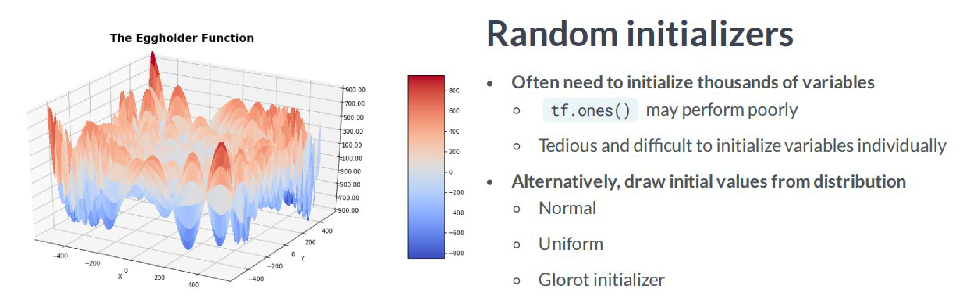

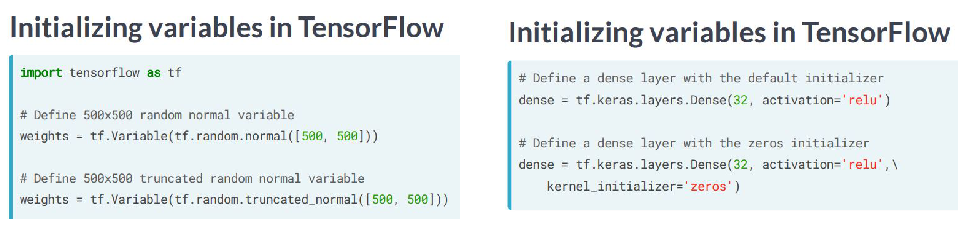

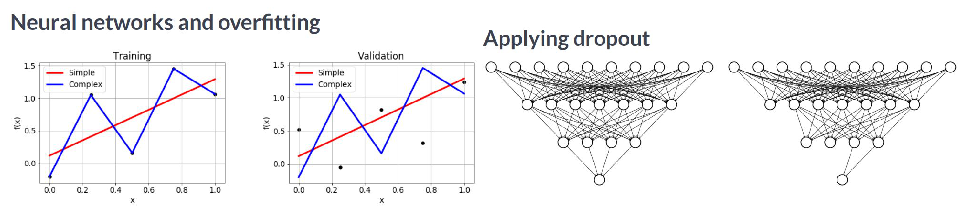

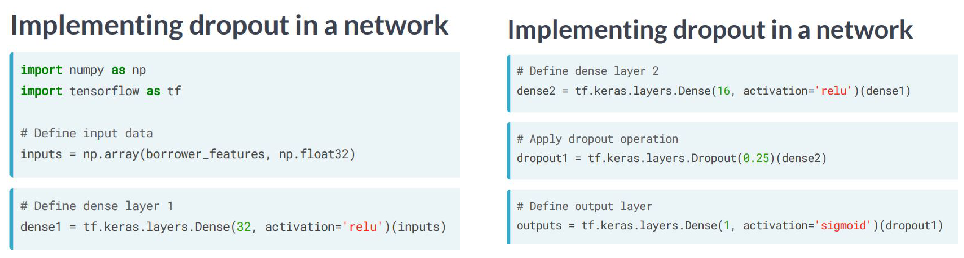

In [49]:
#vídeo
plot_2('eggholder', 'random_init'); plot_2('init', 'init1', wspace=0.1); print("="*120); plot_2('overfitting', 'dropout')
plot_2('dropout1', 'dropout2', wspace=0.1)

Exercício 12

In [50]:
# Initialization in TensorFlow

# all features except 'ID' and 'default.payment.next.month'
select_columns = credit.columns[1:-1]
borrower_features = np.array(credit[select_columns].copy(), np.float32)
default = np.array(credit['default.payment.next.month'].copy(), np.float32).reshape(-1, 1)

###################################################

# Define the layer 1 weights
w1 = Variable(random.normal([len(select_columns), 7]), np.float32)

# Initialize the layer 1 bias
b1 = Variable(ones([7]), np.float32)

# Define the layer 2 weights
w2 = Variable(random.normal([7, 1]), np.float32)

# Define the layer 2 bias
b2 = Variable(0.00, np.float32)

###################################################

display(w1.shape)
display(b1.shape)
display(w2.shape)
display(b2.shape)

TensorShape([23, 7])

TensorShape([7])

TensorShape([7, 1])

TensorShape([])

Exercício 13

In [51]:
# Defining the model and loss function

# In this exercise, you will train a neural network to predict whether a credit card holder will default. The features and 
# targets you will use to train your network are available in the Python shell as borrower_features and default. You defined
# the weights and biases in the previous exercise.

# Note that the predictions layer is defined as σ(layer1∗w2+b2), where σ is the sigmoid activation, layer1 is a tensor of 
# nodes for the first hidden dense layer, w2 is a tensor of weights, and b2 is the bias tensor.
# The trainable variables are w1, b1, w2, and b2. 

# Define the model
def model(w1, b1, w2, b2, features = borrower_features):
    # Apply relu activation functions to layer 1
    layer1 = keras.activations.relu(matmul(features, w1) + b1)
    # Apply dropout
    dropout = keras.layers.Dropout(0.25)(layer1)
    return keras.activations.sigmoid(matmul(dropout, w2) + b2)

# Define the loss function
def loss_function(w1, b1, w2, b2, features = borrower_features, targets = default):
    predictions = model(w1, b1, w2, b2)
    # Pass targets and predictions to the cross entropy loss
    return keras.losses.binary_crossentropy(targets, predictions)


print("""One of the benefits of using tensorflow is that you have the option to customize models down to the linear
algebraic-level, as we've shown in the last two exercises. If you print w1, you can see that the objects we're working with 
are simply tensors.\n""")

print(model(w1, b1, w2, b2), "\n")
print(loss_function(w1, b1, w2, b2))

One of the benefits of using tensorflow is that you have the option to customize models down to the linear
algebraic-level, as we've shown in the last two exercises. If you print w1, you can see that the objects we're working with 
are simply tensors.

tf.Tensor(
[[0.]
 [0.]
 [0.]
 ...
 [0.]
 [0.]
 [0.]], shape=(30000, 1), dtype=float32) 

tf.Tensor([15.424949 15.424949  0.       ... 15.424949 15.424949 15.424949], shape=(30000,), dtype=float32)


Exercício 14

In [52]:
# Training neural networks with TensorFlow

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
train_features, test_features, train_targets, test_targets = train_test_split(borrower_features, default, test_size=0.2)

#######

# Train the model
for j in range(100):
    # Complete the optimizer
    opt.minimize(lambda: loss_function(w1, b1, w2, b2), var_list=[w1, b1, w2, b2])

# Make predictions with model
model_predictions = model(w1, b1, w2, b2, test_features)

# Construct the confusion matrix
display(confusion_matrix(test_targets, model_predictions))

print("""\nThe diagonal elements show the number of correct predictions. The off-diagonal elements show the number of
incorrect predictions. We can see that the model performs reasonably-well, but does so by overpredicting non-default. This
suggests that we may need to train longer, tune the model's hyperparameters, or change the model's architecture.""")

array([[4619,   12],
       [1358,   11]], dtype=int64)


The diagonal elements show the number of correct predictions. The off-diagonal elements show the number of
incorrect predictions. We can see that the model performs reasonably-well, but does so by overpredicting non-default. This
suggests that we may need to train longer, tune the model's hyperparameters, or change the model's architecture.


# CHAPTER 4 - High Level APIs

In the final chapter, you'll use high-level APIs in TensorFlow 2.0 to train a sign language letter classifier. You will use both the sequential and functional Keras APIs to train, validate, make predictions with, and evaluate models. You will also learn how to use the Estimators API to streamline the model definition and training process, and to avoid errors.

#### Exercício 1 - Defining neural networks with Keras

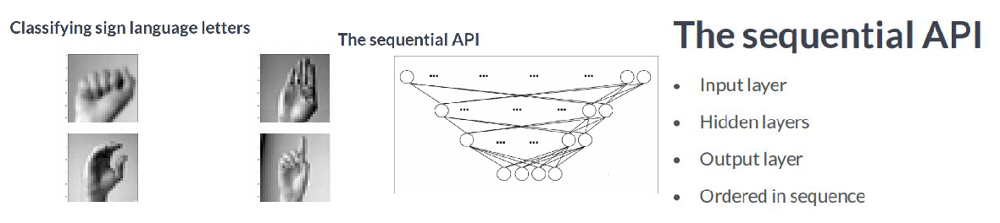

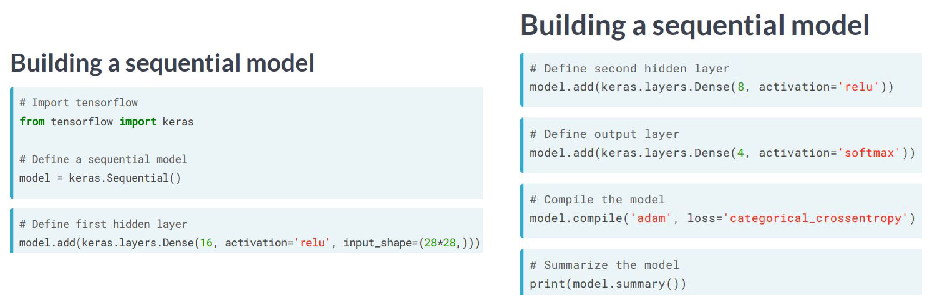

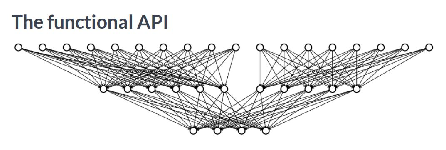

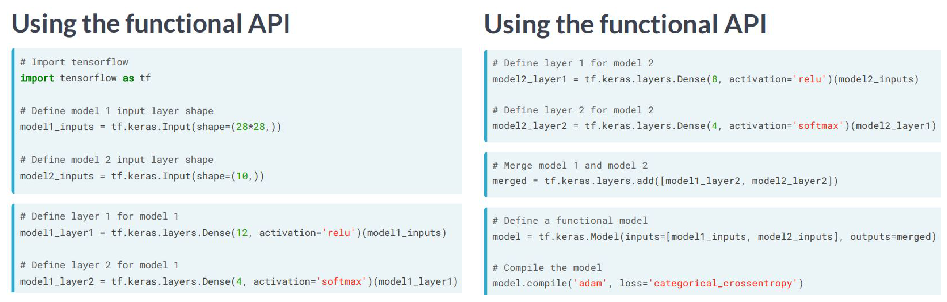

In [53]:
#vídeo
plot_3('class', 'seq_api', 'seq_api2'); plot_2('seq1', 'seq2'); print("="*120); plot_1('seq3'); 
plot_2('func_api', 'func_api2')

Exercício 2

In [54]:
# The sequential model in Keras

# Define a Keras sequential model
model = keras.Sequential()

# Define the first dense layer
model.add(keras.layers.Dense(16, activation='relu', input_shape=(784,)))

# Define the second dense layer
model.add(keras.layers.Dense(8, activation='relu'))

# Define the output layer
model.add(keras.layers.Dense(4, activation='softmax'))

# Print the model architecture
print(model.summary())

print("""\n\nNotice that we've defined a model, but we haven't compiled it. The compilation step in keras allows us to set 
the optimizer, loss function, and other useful training parameters in a single line of code. Furthermore, the .summary() 
method allows us to view the model's architecture.""")

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 16)                12560     
_________________________________________________________________
dense_10 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_11 (Dense)             (None, 4)                 36        
Total params: 12,732
Trainable params: 12,732
Non-trainable params: 0
_________________________________________________________________
None


Notice that we've defined a model, but we haven't compiled it. The compilation step in keras allows us to set 
the optimizer, loss function, and other useful training parameters in a single line of code. Furthermore, the .summary() 
method allows us to view the model's architecture.


Exercício 3

In [55]:
# Compiling a sequential model

# Define the first dense layer
model.add(keras.layers.Dense(16, activation='sigmoid', input_shape=(784,)))

# Apply dropout to the first layer's output
model.add(keras.layers.Dropout(0.25))

# Define the output layer
model.add(keras.layers.Dense(4, activation='softmax'))

# Compile the model
model.compile('adam', loss='categorical_crossentropy')

# Print a model summary
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 16)                12560     
_________________________________________________________________
dense_10 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_11 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_12 (Dense)             (None, 16)                80        
_________________________________________________________________
dropout_103 (Dropout)        (None, 16)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 4)                 68        
Total params: 12,880
Trainable params: 12,880
Non-trainable params: 0
____________________________________________________

Exercício 4

In [56]:
# Defining a multiple input model

# In some cases, the sequential API will not be sufficiently flexible to accommodate your desired model architecture and
# you will need to use the functional API instead. If, for instance, you want to train two models with different 
# architectures jointly, you will need to use the functional API to do this. In this exercise, we will see how to do this. 
# We will also use the .summary() method to examine the joint model's architecture.

m1_inputs = tf.keras.Input(shape=(784))
m2_inputs = tf.keras.Input(shape=(784))

#########

# For model 1, pass the input layer to layer 1 and layer 1 to layer 2
m1_layer1 = keras.layers.Dense(12, activation='sigmoid')(m1_inputs)
m1_layer2 = keras.layers.Dense(4, activation='softmax')(m1_layer1)

# For model 2, pass the input layer to layer 1 and layer 1 to layer 2
m2_layer1 = keras.layers.Dense(12, activation='relu')(m2_inputs)
m2_layer2 = keras.layers.Dense(4, activation='softmax')(m2_layer1)

# Merge model outputs and define a functional model
merged = keras.layers.add([m1_layer2, m2_layer2])
model = keras.Model(inputs=[m1_inputs, m2_inputs], outputs=merged)

# Print a model summary
print(model.summary())

print("""\nNotice that the .summary() method yields a new column: connected to. This column tells you how layers connect to
each other within the network. We can see that dense_14, for instance, is connected to the input_1 layer. We can also see 
that the add layer, which merged the two models, connected to both dense_15 and dense_17.""")

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 784)]        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 784)]        0                                            
__________________________________________________________________________________________________
dense_14 (Dense)                (None, 12)           9420        input_1[0][0]                    
__________________________________________________________________________________________________
dense_16 (Dense)                (None, 12)           9420        input_2[0][0]                    
______________________________________________________________________________________________

#### Exercício 5 - Training and validation with Keras

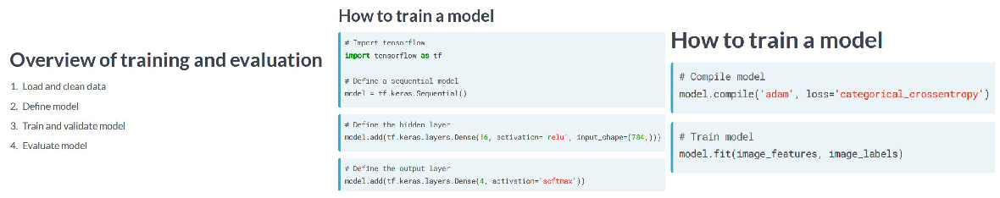

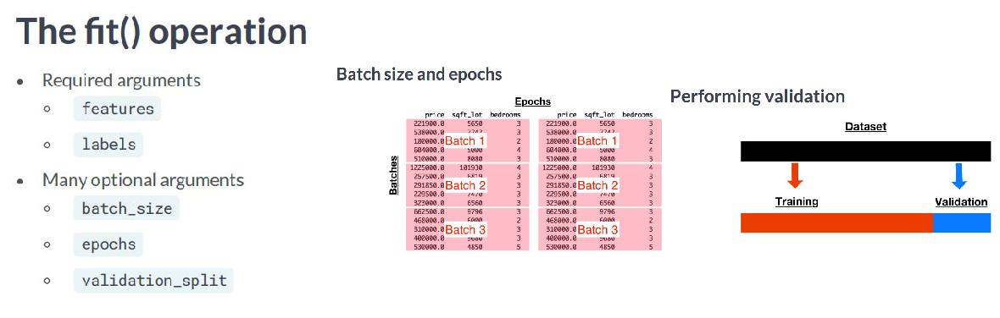

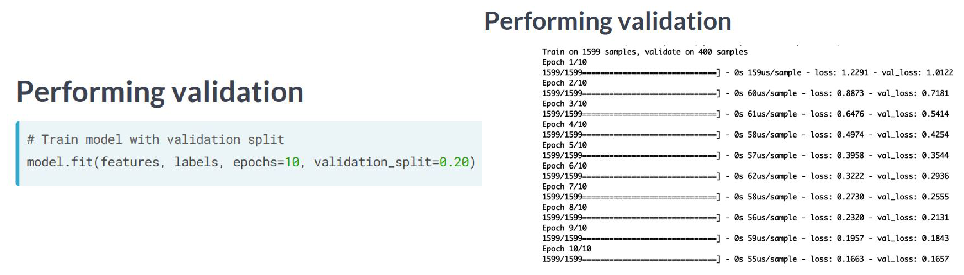

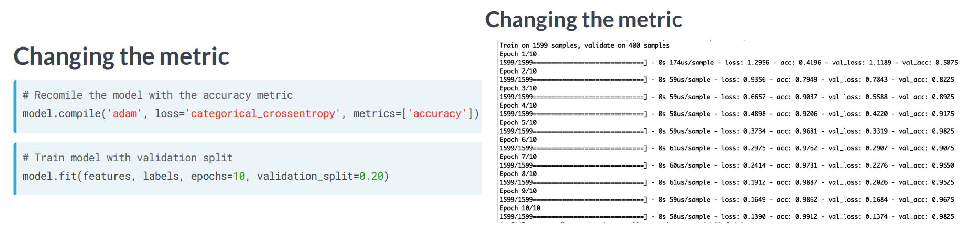

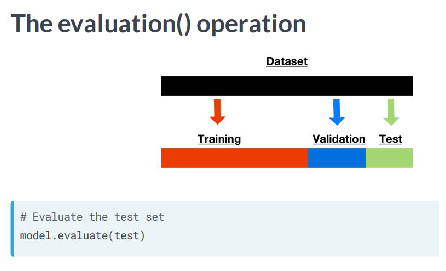

In [57]:
#vídeo
plot_3('overview', 'train', 'train2'); plot_3('fit', 'batch_size', 'validation'); plot_2('validation2', 'validation3')
print("="*120); plot_2('metric', 'metric2'); print("="*120); plot_1('evaluation')

Exercício 6

In [58]:
# Training with Keras

# In this exercise, we return to our sign language letter classification problem. We have 2000 images of four letters--
# A, B, C, and D--and we want to classify them with a high level of accuracy. We will complete all parts of the problem, 
# including the model definition, compilation, and training.

signs = pd.read_csv(data_folder + "slmnist.csv", header=None)
sign_language_features = np.array(signs.iloc[:, 1:], np.float32)
sign_language_labels = np.array(pd.get_dummies(signs.iloc[:, 0]), np.float32)#.reshape(-1, 1)

display(signs.head())
display(signs[0].value_counts())

###################################


# Define a sequential model
model = keras.Sequential()

# Define a hidden layer
model.add(keras.layers.Dense(16, activation='relu', input_shape=(784,)))

# Define the output layer
model.add(keras.layers.Dense(4, activation='softmax'))

# Compile the model
model.compile('SGD', loss='categorical_crossentropy')

# Complete the fitting operation
model.fit(sign_language_features, sign_language_labels, epochs=5)

print("""\nYou probably noticed that your only measure of performance improvement was the value of the loss function in the
training sample, which is not particularly informative. You will improve on this in the next exercise.""")

,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,784
0,1,142,143,146,148,149,149,149,150,151,...,0,15,55,63,37,61,77,65,38,23
1,0,141,142,144,145,147,149,150,151,152,...,173,179,179,180,181,181,182,182,183,183
2,1,156,157,160,162,164,166,169,171,171,...,181,197,195,193,193,191,192,198,193,182
3,3,63,26,65,86,97,106,117,123,128,...,175,179,180,182,183,183,184,185,185,185
4,1,156,160,164,168,172,175,178,180,182,...,108,107,106,110,111,108,108,102,84,70


3    500
2    500
1    500
0    500
Name: 0, dtype: int64

Epoch 1/5
63/63 [==============================] - 0s 2ms/step - loss: 11034.2432
Epoch 2/5
63/63 [==============================] - 0s 2ms/step - loss: 1.3864
Epoch 3/5
63/63 [==============================] - 0s 2ms/step - loss: 1.3864
Epoch 4/5
63/63 [==============================] - 0s 2ms/step - loss: 1.3864
Epoch 5/5
63/63 [==============================] - 0s 1ms/step - loss: 1.3864

You probably noticed that your only measure of performance improvement was the value of the loss function in the
training sample, which is not particularly informative. You will improve on this in the next exercise.


Exercício 7

In [59]:
# Metrics and validation with Keras

# Since we did not use a validation split, we only observed performance improvements within the training set; however, it
# is unclear how much of that was due to OVERFITTING. Furthermore, since we did not supply a METRIC, we only saw decreases 
# in the loss function, which do not have any clear interpretation.

# Define sequential model
model = keras.Sequential()

# Define the first layer
model.add(keras.layers.Dense(32, activation='sigmoid', input_shape=(784,)))

# Add activation function to classifier
model.add(keras.layers.Dense(4, activation='softmax'))

# Set the optimizer, loss function, and metrics
model.compile(optimizer='RMSprop', loss='categorical_crossentropy', metrics=['accuracy'])

# Add the number of epochs and the validation split
model.fit(sign_language_features, sign_language_labels, epochs=10, validation_split=0.1)

#not so good...

Epoch 1/10
57/57 [==============================] - 0s 7ms/step - loss: 1.4301 - accuracy: 0.2567 - val_loss: 1.3909 - val_accuracy: 0.2150
Epoch 2/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3879 - accuracy: 0.2411 - val_loss: 1.3887 - val_accuracy: 0.2500
Epoch 3/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3885 - accuracy: 0.2378 - val_loss: 1.3851 - val_accuracy: 0.2550
Epoch 4/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3883 - accuracy: 0.2289 - val_loss: 1.3886 - val_accuracy: 0.2550
Epoch 5/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3881 - accuracy: 0.2428 - val_loss: 1.3882 - val_accuracy: 0.2550
Epoch 6/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3886 - accuracy: 0.2378 - val_loss: 1.3868 - val_accuracy: 0.2150
Epoch 7/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3885 - accuracy: 0.2317 - val_loss: 1.3877 - val_accuracy: 0.2500
Epoch 8/10
57/57 [==

Exercício 8

In [60]:
# Overfitting detection

# Define sequential model
model = keras.Sequential()

# Define the first layer
model.add(keras.layers.Dense(1024, activation='relu', input_shape=(784,)))

# Add activation function to classifier
model.add(keras.layers.Dense(4, activation='softmax'))

# Finish the model compilation
model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Complete the model fit operation
model.fit(sign_language_features, sign_language_labels, epochs=30, validation_split=0.5)

print("""\nYou may have noticed that the validation loss, 'val_loss', was substantially higher than the training loss,
'loss'. Furthermore, if val_loss started to increase before the training process was terminated, then we may have 
overfitted. When this happens, you will want to try decreasing the number of epochs.""")

Epoch 1/30
32/32 [==============================] - 1s 19ms/step - loss: 405.5861 - accuracy: 0.3730 - val_loss: 59.2191 - val_accuracy: 0.5250
Epoch 2/30
32/32 [==============================] - 1s 20ms/step - loss: 14.7804 - accuracy: 0.7580 - val_loss: 4.3807 - val_accuracy: 0.8800
Epoch 3/30
32/32 [==============================] - 1s 23ms/step - loss: 2.9114 - accuracy: 0.9150 - val_loss: 1.1168 - val_accuracy: 0.9680
Epoch 4/30
32/32 [==============================] - 1s 17ms/step - loss: 0.3757 - accuracy: 0.9820 - val_loss: 0.4259 - val_accuracy: 0.9700
Epoch 5/30
32/32 [==============================] - 1s 20ms/step - loss: 2.8165 - accuracy: 0.9380 - val_loss: 0.6018 - val_accuracy: 0.9760
Epoch 6/30
32/32 [==============================] - 1s 21ms/step - loss: 4.9396 - accuracy: 0.8850 - val_loss: 0.7139 - val_accuracy: 0.9780
Epoch 7/30
32/32 [==============================] - 1s 22ms/step - loss: 0.8943 - accuracy: 0.9700 - val_loss: 0.2655 - val_accuracy: 0.9850
Epoch 8/3

Exercício 9

In [61]:
%%script false
# Evaluating models


# Two models have been trained and are available: large_model, which has many parameters; and small_model, which has fewer
# parameters. Both models have been trained using train_features and train_labels, which are available to you. A separate 
# test set, which consists of test_features and test_labels, is also available.

# Your goal is to evaluate relative model performance and also determine whether either model exhibits signs of overfitting.
# You will do this by evaluating large_model and small_model on both the train and test sets. For each model, you can do 
# this by applying the .evaluate(x, y) method to compute the loss for features x and labels y. You will then compare the 
# four losses generated.

# Evaluate the small model using the train data
small_train = small_model.evaluate(train_features, train_labels)

# Evaluate the small model using the test data
small_test = small_model.evaluate(test_features, test_labels)

# Evaluate the large model using the train data
large_train = large_model.evaluate(train_features, train_labels)

# Evaluate the large model using the test data
large_test = large_model.evaluate(test_features, test_labels)

# Print losses
print('\n Small - Train: {}, Test: {}'.format(small_train, small_test))
print('Large - Train: {}, Test: {}'.format(large_train, large_test))

Couldn't find program: 'false'


In [62]:
# meu
train_features, test_features, train_targets, test_targets = train_test_split(sign_language_features, sign_language_labels,
                                                                              test_size=0.2)

# Define sequential model
model1 = keras.Sequential()
model1.add(keras.layers.Dense(32, activation='sigmoid', input_shape=(784,)))
model1.add(keras.layers.Dense(4, activation='softmax'))
model1.compile(optimizer='RMSprop', loss='categorical_crossentropy', metrics=['accuracy'])
model1.fit(sign_language_features, sign_language_labels, epochs=10, validation_split=0.1)

model_train1 = model1.evaluate(train_features, train_targets)
model_test1 = model1.evaluate(test_features, test_targets)

model_train2 = model.evaluate(train_features, train_targets)
model_test2 = model.evaluate(test_features, test_targets)

# Print losses
print('\n Model Small - Train: {}, Test: {}'.format(model_train1, model_test1))
print('\n Model Large - Train: {}, Test: {}\n'.format(model_train2, model_test2))

print("""Notice that the gap between the test and train set losses is high for large_model, suggesting that overfitting may
be an issue. Furthermore, both test and train set performance is better for large_model. This suggests that we may want to 
use large_model, but reduce the number of training epochs.""")

Epoch 1/10
57/57 [==============================] - 0s 5ms/step - loss: 1.4328 - accuracy: 0.2317 - val_loss: 1.3911 - val_accuracy: 0.2500
Epoch 2/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3883 - accuracy: 0.2433 - val_loss: 1.3885 - val_accuracy: 0.2550
Epoch 3/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3881 - accuracy: 0.2272 - val_loss: 1.3912 - val_accuracy: 0.2150
Epoch 4/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3876 - accuracy: 0.2539 - val_loss: 1.3883 - val_accuracy: 0.2500
Epoch 5/10
57/57 [==============================] - 0s 4ms/step - loss: 1.3878 - accuracy: 0.2533 - val_loss: 1.3893 - val_accuracy: 0.2550
Epoch 6/10
57/57 [==============================] - 0s 5ms/step - loss: 1.3885 - accuracy: 0.2311 - val_loss: 1.3879 - val_accuracy: 0.2150
Epoch 7/10
57/57 [==============================] - 0s 3ms/step - loss: 1.3881 - accuracy: 0.2333 - val_loss: 1.3889 - val_accuracy: 0.2150
Epoch 8/10
57/57 [==

#### Exercício 10 - Training models with the Estimators API

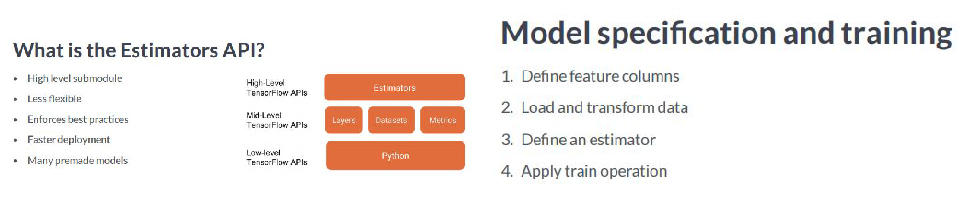

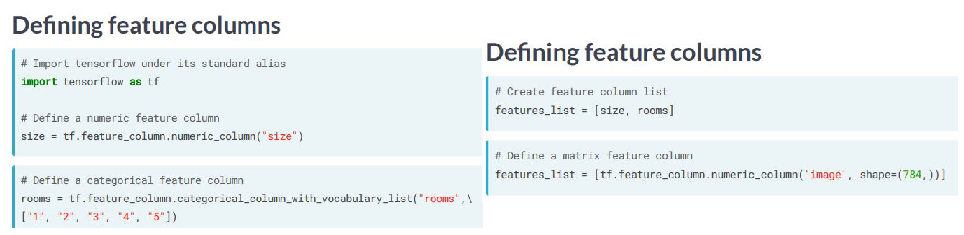

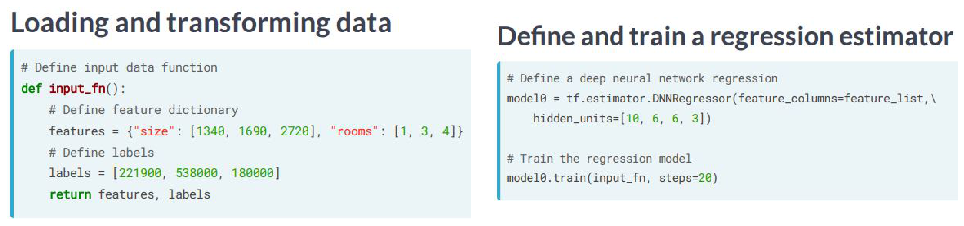

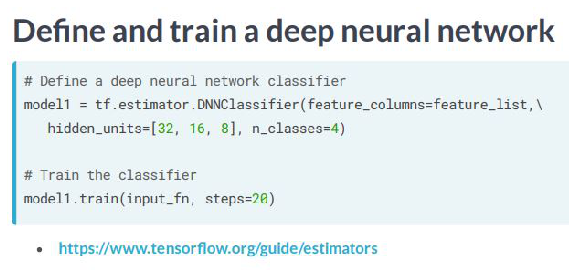

In [63]:
#vídeo
plot_2('estimators_api', 'model_est', wspace=0.05); print("="*120); plot_2('feature_col', 'feature_col2'); print("="*120)
plot_2('loading', 'define_est', wspace=0.05); print("="*120); plot_1('train_nn', right=1.3)

- https://www.tensorflow.org/guide/estimator

Exercício 11

In [64]:
# Preparing to train with Estimators

# For this exercise, we'll return to the King County housing transaction dataset from chapter 2. We will again develop and
# train a machine learning model to predict house prices; however, this time, we'll do it using the estimator API.

# Rather than completing everything in one step, we'll break this procedure down into parts. We'll begin by defining the
# feature columns and loading the data. In the next exercise, we'll define and train a premade estimator. 
# Note that feature_column has been imported for you from tensorflow.

from tensorflow import feature_column

display(housing.head())

#############################################################################################################

# Define feature columns for bedrooms and bathrooms
bedrooms = feature_column.numeric_column("bedrooms")
bathrooms = feature_column.numeric_column("bathrooms")

# Define the list of feature columns
feature_list = [bedrooms, bathrooms]

def input_fn():
    # Define the labels
    labels = np.array(housing['price'])
    # Define the features
    features = {'bedrooms':np.array(housing['bedrooms']), 'bathrooms':np.array(housing['bathrooms'])}
    return features, labels


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


Exercício 12

In [65]:
# Defining Estimators

from tensorflow import estimator

# Define the model and set the number of steps
model = estimator.DNNRegressor(feature_columns=feature_list, hidden_units=[2,2])
model.train(input_fn, steps=1)


INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Admin\\AppData\\Local\\Temp\\tmpmteib9gj', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
I

In [66]:
# Modify the code to use a LinearRegressor(), remove the hidden_units, and set the number of steps to 2.

# Define the model and set the number of steps
model = estimator.LinearRegressor(feature_columns=feature_list)
model.train(input_fn, steps=2)

# Note that you have other premade estimator options, such as BoostedTreesRegressor(), and can also create your own custom 
# estimators.

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Admin\\AppData\\Local\\Temp\\tmpphkw52jl', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.

If you intended to run this layer in float32, y

#### Exercício 13 - end

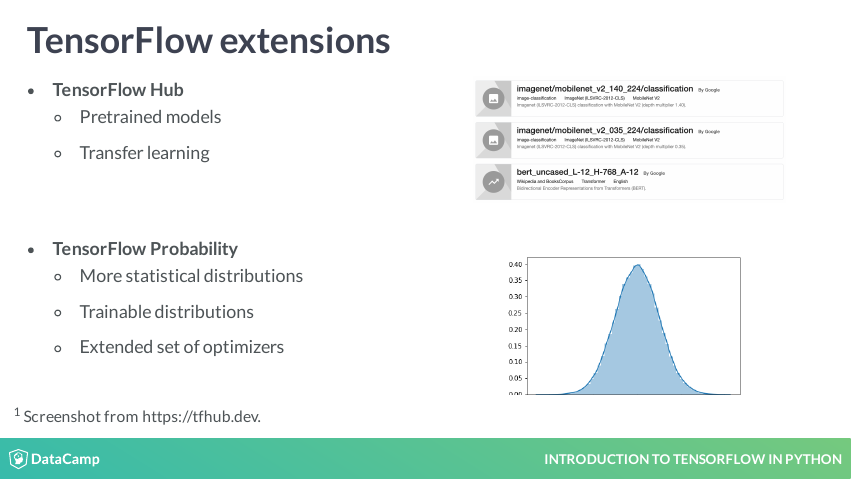

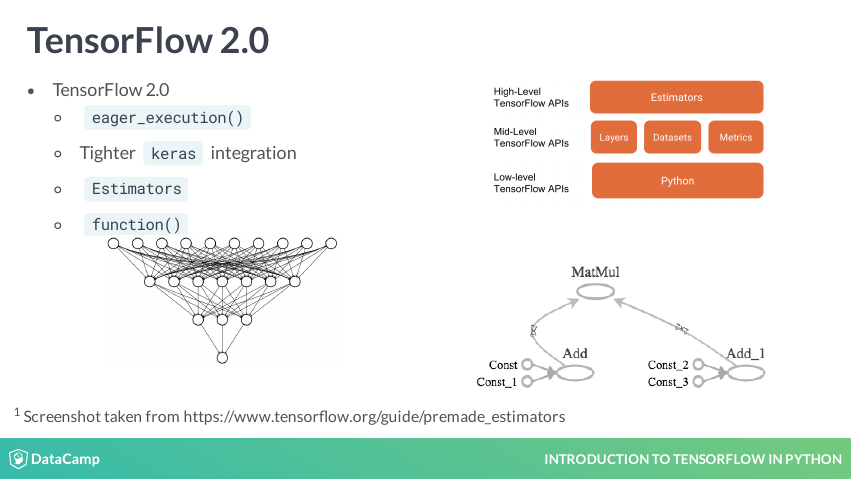

In [67]:
#vídeo
display(pdf_4[35]); print("="*120); display(pdf_4[36])

# Fim